# **QF 632** - Financial Data Science
## Final Group Project

#### Group 4 Member:
- Chang WenYu
- Maureen Calista Chandra
- Nethania Abigail
- Rohen So Veera Kumaran
- Zhang Yinliang

##  Building Credit Card Fraud Prediction and Security Risk Monitoring Model Using Machine Learning Techniques

In [ ]:
#pip install tensorflow

In [ ]:
#pip install imbalanced-learn

In [3]:
import pandas as pd
import numpy as np
from datetime import datetime
from math import radians, sin, cos, sqrt, atan2

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

from sklearn.preprocessing import LabelEncoder
from scipy.stats import gaussian_kde
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
from sklearn.calibration import CalibratedClassifierCV

from sklearn.ensemble import RandomForestClassifier, IsolationForest
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    confusion_matrix, classification_report)
from sklearn.inspection import permutation_importance
from sklearn.utils import shuffle
from sklearn.metrics import roc_curve, roc_auc_score

import xgboost
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost.callback import EarlyStopping

import seaborn as sns
import tensorflow as tf

## Part 1: Data Pre-Processing

### 1.1: Data Collection

The raw dataset used for this project is from https://www.kaggle.com/datasets/neharoychoudhury/credit-card-fraud-data/data

In [4]:
df = pd.read_csv('fraud_data.csv')
df

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
0,04-01-2019 00:58,"""Stokes, Christiansen and Sipes""",grocery_net,14.37,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a3806e984cec6ac0096d8184c64ad3a1,65.654142,-164.722603,1
1,04-01-2019 15:06,Predovic Inc,shopping_net,966.11,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a59185fe1b9ccf21323f581d7477573f,65.468863,-165.473127,1
2,04-01-2019 22:37,Wisozk and Sons,misc_pos,49.61,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,86ba3a888b42cd3925881fa34177b4e0,65.347667,-165.914542,1
3,04-01-2019 23:06,Murray-Smitham,grocery_pos,295.26,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,3a068fe1d856f0ecedbed33e4b5f4496,64.445035,-166.080207,1
4,04-01-2019 23:59,Friesen Lt,health_fitness,18.17,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,891cdd1191028759dc20dc224347a0ff,65.447094,-165.446843,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14441,22-01-2019 00:37,Hudson-Grady,shopping_pos,122.00,Athena,OR,45.8289,-118.4971,1302,Dealer,18-10-1976,699a4c06b22711bf3e0d8ef91232d356,46.442439,-118.524214,0
14442,22-01-2019 00:41,"""Nienow, Ankunding and Collie""",misc_pos,9.07,Gardiner,OR,43.7857,-124.1437,260,"""Engineer, maintenance""",01-09-1956,080d620d24815c7d6c637cf0b71dde8e,42.901265,-124.995317,0
14443,22-01-2019 00:42,Pacocha-O'Reilly,grocery_pos,104.84,Alva,WY,44.6873,-104.4414,110,"""Administrator, local government""",16-05-1973,3c346c8cd627c5fe3ed57430db2e9ae7,45.538062,-104.542117,0
14444,22-01-2019 00:48,"""Bins, Balistreri and Beatty""",shopping_pos,268.16,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,e66ffcc95ba7fc490486242af1205d04,64.081462,-165.898698,0


### 1.2: Data cleaning

In [5]:
# Step 1: Examine the target variable --> is_fraud to check whether we need to pre-processing the data
print(df['is_fraud'].unique())

## Since the target variable has several unique values, we should make it uniform to be strictly to binary data [0, 1]
df_cleaned = df.copy()
df_cleaned['is_fraud'] = df_cleaned['is_fraud'].astype(str).str.extract(r'(\d)').astype(int)

['1' '1"2020-12-24 16:56:24"' '0' '0"2019-01-01 00:00:44"']


In [6]:
# Step 2: Extract info on transaction date and time
df_cleaned['trans_date_trans_time'] = pd.to_datetime(df_cleaned['trans_date_trans_time'], errors='coerce') 

## Separate the transaction date into more specific time (date, hour)
df_cleaned['date'] = df_cleaned['trans_date_trans_time'].dt.date  # represent the transaction date
df_cleaned['hour'] = df_cleaned['trans_date_trans_time'].dt.hour # represent the time transaction placed (in hour)
df_cleaned['day_of_week'] = df_cleaned['trans_date_trans_time'].dt.dayofweek # represent the days in week (0-6 for Mon to Sun)
df_cleaned['is_weekend'] = df_cleaned['day_of_week'].isin([5, 6]).astype(int) # classify whether transaction is happened during weekend or not [0,1]

## Since the transaction data time have several NaT values, indicating missing timestamp, so to avoid any prediction bias, we create new column for missing time flag
display(df_cleaned[df_cleaned['trans_date_trans_time'].isna()])
df_cleaned['missing_time_flag'] = df_cleaned['trans_date_trans_time'].isna().astype(int) # might represent suspicious behavior (e.g., manual system entries or system error, etc)

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,date,hour,day_of_week,is_weekend
24,NaT,Kiehn-Emmerich,grocery_pos,320.60,Ravenna,NE,41.0233,-98.9041,2202,"""Solicitor, Scotland""",21-06-1974,98649f992d93377c62c09e51a1bd2cc9,41.867565,-99.096279,1,NaT,NaN,NaN,0
25,NaT,"""Osinski, Ledner and Leuschke""",grocery_pos,276.80,Ravenna,NE,41.0233,-98.9041,2202,"""Solicitor, Scotland""",21-06-1974,a28b688a63d93fb5935d6a3dfb22ecf6,41.700959,-98.207349,1,NaT,NaN,NaN,0
26,NaT,Vandervort-Funk,grocery_pos,336.20,Ravenna,NE,41.0233,-98.9041,2202,"""Solicitor, Scotland""",21-06-1974,62e0c792222afcc2ef1644a81ffdeb47,41.965421,-98.334757,1,NaT,NaN,NaN,0
27,NaT,Terry-Huel,shopping_net,994.92,San Jose,CA,37.3304,-121.7913,973849,Science writer,12-06-1955,a2c0f59146a22479dd65bae74d6d7741,38.075623,-122.148270,1,NaT,NaN,NaN,0
28,NaT,Volkman-Predovic,shopping_net,1062.95,Ravenna,NE,41.0233,-98.9041,2202,"""Solicitor, Scotland""",21-06-1974,2182d9659d60dfa68fa1f39baa2fc635,41.942402,-98.005584,1,NaT,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14441,NaT,Hudson-Grady,shopping_pos,122.00,Athena,OR,45.8289,-118.4971,1302,Dealer,18-10-1976,699a4c06b22711bf3e0d8ef91232d356,46.442439,-118.524214,0,NaT,NaN,NaN,0
14442,NaT,"""Nienow, Ankunding and Collie""",misc_pos,9.07,Gardiner,OR,43.7857,-124.1437,260,"""Engineer, maintenance""",01-09-1956,080d620d24815c7d6c637cf0b71dde8e,42.901265,-124.995317,0,NaT,NaN,NaN,0
14443,NaT,Pacocha-O'Reilly,grocery_pos,104.84,Alva,WY,44.6873,-104.4414,110,"""Administrator, local government""",16-05-1973,3c346c8cd627c5fe3ed57430db2e9ae7,45.538062,-104.542117,0,NaT,NaN,NaN,0
14444,NaT,"""Bins, Balistreri and Beatty""",shopping_pos,268.16,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,e66ffcc95ba7fc490486242af1205d04,64.081462,-165.898698,0,NaT,NaN,NaN,0


In [7]:
# Step 3: Extract info on the age of credit holder using 'dob' and today's year (i.e. 2025)
current_year = datetime.now().year
df_cleaned['dob'] = pd.to_datetime(df_cleaned['dob'], errors='coerce') # represent DOB of credit holder / purchaser
df_cleaned['age'] = current_year - df_cleaned['dob'].dt.year # represent the current age of credit holder / purchaser

## Since there are some nan values on the age due to NaT in dob, we replace the data with average
display(df_cleaned[df_cleaned['age'].isna()])
df_cleaned['age'] = df_cleaned['age'].fillna(round(df_cleaned['age'].mean())).astype(int)

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,...,trans_num,merch_lat,merch_long,is_fraud,date,hour,day_of_week,is_weekend,missing_time_flag,age
7,2019-05-01 11:31:00,Padberg-Welch,grocery_pos,367.29,Browning,MO,40.0290,-93.1607,602,Cytogeneticist,...,5fbe827807ec9f557f6242bb48db0e51,39.167065,-93.705245,1,2019-05-01,11.0,2.0,0,0,NaN
10,2019-05-01 22:05:00,"""Gottlieb, Considine and Schultz""",shopping_net,1177.79,Browning,MO,40.0290,-93.1607,602,Cytogeneticist,...,f1c51701d8b5dd6ebfe7c1aebf0c4fe7,39.288305,-92.476947,1,2019-05-01,22.0,2.0,0,0,NaN
17,2019-05-01 23:26:00,Barrows PLC,shopping_pos,762.93,Browning,MO,40.0290,-93.1607,602,Cytogeneticist,...,19b126ecf4c79997e9edc6f260c09880,40.205262,-93.499211,1,2019-05-01,23.0,2.0,0,0,NaN
18,2019-06-01 18:39:00,Fisher-Schowalte,shopping_net,855.88,Browning,MO,40.0290,-93.1607,602,Cytogeneticist,...,bbae703c3794b7738d08739afbaef898,40.786018,-93.301092,1,2019-06-01,18.0,5.0,1,0,NaN
19,2019-06-01 23:33:00,Gleason-Macejkovic,shopping_net,909.29,Browning,MO,40.0290,-93.1607,602,Cytogeneticist,...,b98eb7183ee8a48e83539addc80ea9cc,40.977312,-93.550980,1,2019-06-01,23.0,5.0,1,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14439,NaT,"""Willms, Kris and Bergnaum""",shopping_pos,145.60,Athena,OR,45.8289,-118.4971,1302,Dealer,...,c206b545e52a142e1009fb0bd3e3f2ac,46.592719,-118.002289,0,NaT,NaN,NaN,0,1,NaN
14440,NaT,Wiza LLC,misc_pos,37.92,Syracuse,MO,38.6547,-92.8929,628,"""Radiographer, diagnostic""",...,a98a9e2ca6a7c605c34a4298be3ad606,39.245730,-92.441388,0,NaT,NaN,NaN,0,1,NaN
14441,NaT,Hudson-Grady,shopping_pos,122.00,Athena,OR,45.8289,-118.4971,1302,Dealer,...,699a4c06b22711bf3e0d8ef91232d356,46.442439,-118.524214,0,NaT,NaN,NaN,0,1,NaN
14443,NaT,Pacocha-O'Reilly,grocery_pos,104.84,Alva,WY,44.6873,-104.4414,110,"""Administrator, local government""",...,3c346c8cd627c5fe3ed57430db2e9ae7,45.538062,-104.542117,0,NaT,NaN,NaN,0,1,NaN


In [8]:
# Step 4: Extract info the distance between purchase transaction occurred and the merchant 
## Calculate the distance using Haversine formula between two coordinate points
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Earth radius in km
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1 
    dlon = lon2 - lon1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a)) 
    return R * c

df_cleaned['distance_km'] = df_cleaned.apply(
    lambda row: haversine(row['lat'], row['long'], row['merch_lat'], row['merch_long']), axis=1)

In [9]:
# Step 5: Encode categorical variables into numerical
categorical_cols = ['merchant', 'category', 'city', 'state', 'job']

le = LabelEncoder()
for col in categorical_cols:
    df_cleaned[col] = le.fit_transform(df_cleaned[col].astype(str))
    
# Step 6: drop transaction ID as it is unique and not predictive
df_cleaned.drop(columns=['trans_num'], inplace=True)  
df_cleaned.head()

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,...,merch_lat,merch_long,is_fraud,date,hour,day_of_week,is_weekend,missing_time_flag,age,distance_km
0,2019-04-01 00:58:00,179,3,14.37,166,0,64.7556,-165.6723,145,1,...,65.654142,-164.722603,1,2019-04-01,0.0,0.0,0,0,86,109.285552
1,2019-04-01 15:06:00,564,11,966.11,166,0,64.7556,-165.6723,145,1,...,65.468863,-165.473127,1,2019-04-01,15.0,0.0,0,0,86,79.856896
2,2019-04-01 22:37:00,682,9,49.61,166,0,64.7556,-165.6723,145,1,...,65.347667,-165.914542,1,2019-04-01,22.0,0.0,0,0,86,66.807915
3,2019-04-01 23:06:00,537,4,295.26,166,0,64.7556,-165.6723,145,1,...,64.445035,-166.080207,1,2019-04-01,23.0,0.0,0,0,86,39.636227
4,2019-04-01 23:59:00,352,5,18.17,166,0,64.7556,-165.6723,145,1,...,65.447094,-165.446843,1,2019-04-01,23.0,0.0,0,0,86,77.611529


In [10]:
# Step 6: Check any missing values on the dataset
missing_info =df_cleaned.isnull().sum()
print(missing_info)

trans_date_trans_time    10089
merchant                     0
category                     0
amt                          0
city                         0
state                        0
lat                          0
long                         0
city_pop                     0
job                          0
dob                       9821
merch_lat                    0
merch_long                   0
is_fraud                     0
date                     10089
hour                     10089
day_of_week              10089
is_weekend                   0
missing_time_flag            0
age                          0
distance_km                  0
dtype: int64


<b>Team Analysis<b/>:
- Transaction date and time also DOB has 10,089 and 9,821 null values (NaT) respectively. We choose to keep since it comprises approx. 70% of dataset. Dropping these missing values would make our dataset to lose much of the important information necessary to make the prediction and could suffer lookahead bias. Other variables that are derived from the 'trans_date_trans_time' also has the same null values amount.
- To handle this, we form another variables of 'missing_time_flag' to indicate the missing time transactions; for DOB, since we only use the age parameter, we take average of the credit holder age

### 1.3: Data Imbalance Check

Check any indication on data imbalance with respect to target values: *is_fraud*

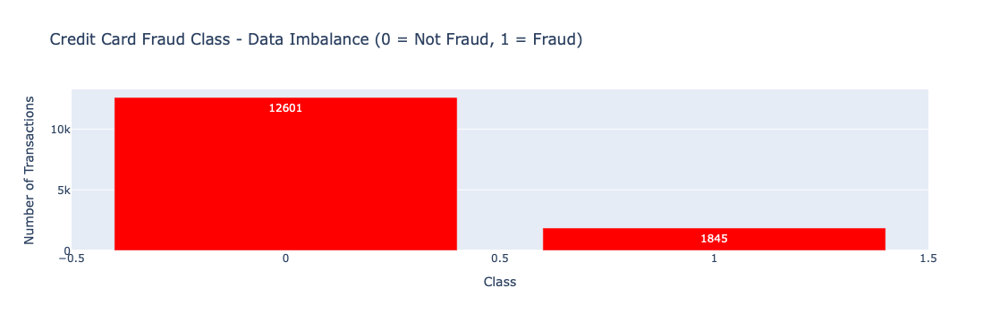

Percentage of Minority Class (Class 1 / Fraud): 12.77 %


In [11]:
# Check for imbalanced classes -- count the number of fraud and non-fraud transactions using visual plot
temp = df_cleaned["is_fraud"].value_counts()
df_plot = pd.DataFrame({'Class': temp.index, 'values': temp.values})

fig = go.Figure(
    data=[
        go.Bar(
            x=df_plot['Class'],
            y=df_plot['values'],
            text=df_plot['values'],
            marker=dict(color='red'),
            name='Class Distribution'
        )
    ]
)

fig.update_layout(
    title='Credit Card Fraud Class - Data Imbalance (0 = Not Fraud, 1 = Fraud)',
    xaxis_title='Class',
    yaxis_title='Number of Transactions',
    width=1000,
    hovermode='closest'
)

fig.show()

minority_pct = (df_cleaned["is_fraud"] == 1).sum() / len(df_cleaned["is_fraud"]) * 100
print(f'Percentage of Minority Class (Class 1 / Fraud): {minority_pct:.2f} %')

<b>Team Analysis<b/>:
- Based on plot above, we see that most of dataset are dominated by Class 0 which represents the 'Not Fraud Transactions', thus becoming the majority class. The minority class is 12.77% of the dataset, indicating the imbalance data is not extreme (e.g., <1%).
- This imbalanced data would lead the model prediction to bias towards the major class with high accuracy values but misleading prediction. Furthermore, the model would learn to ignore the minority class (Class 1 / Fraud Transactions), consequently makes our prediction results have more false negatives due to missing real fraud cases.
- To solve this, we should perform resampling to balance the class distribution before proceed to the training process. The resampling procedure involves oversampling method, which it would try to increase the sample of the minority class by replicating the existing examples of minor class or generating of synthetic new data points. This would prevent model to overfit the major class and improves several evaluation metrics for building model prediction that aims to detect important but infrequent events (i.e., fraud transactions)
- Oversampling method should be applied only to the train data to prevent any data leakage to the validation and test set which could make the prediction result is overly optimistic

### Part 2: Exploratory Data Analysis (EDA)

#### 2.1: Transaction Time

In [12]:
# Obtain number of transactions where hour is missing by label
missing_hour = df_cleaned[df_cleaned['hour'].isna()]
missing_summary = missing_hour.groupby('is_fraud').size().rename('missing_count').reset_index()

# Total transactions per class
total_by_class = df_cleaned.groupby('is_fraud').size().rename('total_count').reset_index()
missing_info = total_by_class.merge(missing_summary, on='is_fraud', how='left')
missing_info['missing_count'] = missing_info['missing_count'].fillna(0).astype(int)
missing_info['percent_missing'] = (missing_info['missing_count'] / missing_info['total_count']) * 100

print("Missing transaction time details:\n")
print(missing_info)

Missing transaction time details:

   is_fraud  total_count  missing_count  percent_missing
0         0        12601           8936        70.915007
1         1         1845           1153        62.493225


#### 2.1.1: Time within a Day (in hours)

Main question: <b> "At what time of day do fraudsters most often carry out fraudulent transactions?" <b/>

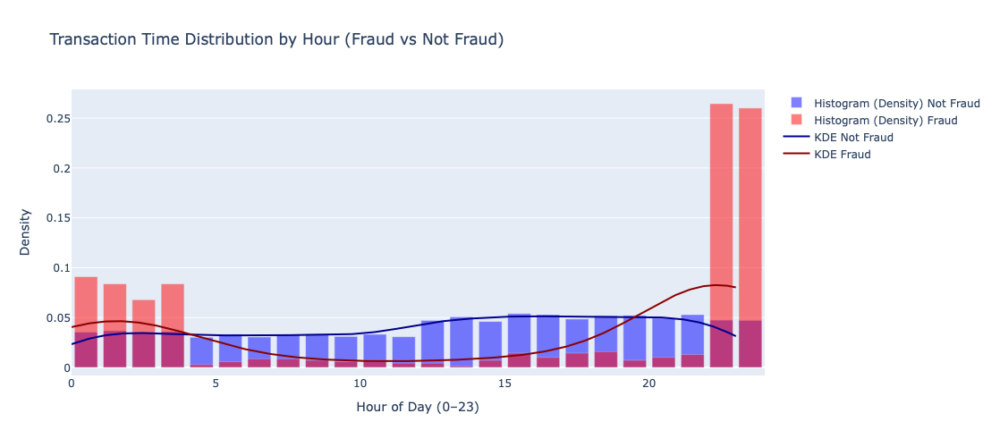

In [13]:
# Step 1: Extract hours for each class of 0 and 1 
## We drop the missing time transaction to get clearer picture from the distribution based on the complete and valid transaction data
hours_0 = df_cleaned[df_cleaned['is_fraud'] == 0]['hour'].dropna()
hours_1 = df_cleaned[df_cleaned['is_fraud'] == 1]['hour'].dropna()

# Step 2: Kernel Density Estimation setup
kde_hours_0 = gaussian_kde(hours_0)
kde_hours_1 = gaussian_kde(hours_1)

# Step 3: Visualize using KDE and Histogram plot
x_hours_range = np.linspace(0, 23, 500) # assumptions: across 24 hours 

## == Class 0 : Non Fraud ==
density_0 = kde_hours_0(x_hours_range)
hist_vals_0, hist_edges_0 = np.histogram(hours_0, bins=24, range=(0, 24), density=True)
hist_x_0 = 0.5 * (hist_edges_0[1:] + hist_edges_0[:-1])  # bin centers

## == Class 1 : Fraud ==
density_1 = kde_hours_1(x_hours_range)
hist_vals_1, hist_edges_1 = np.histogram(hours_1, bins=24, range=(0, 24), density=True)
hist_x_1 = 0.5 * (hist_edges_1[1:] + hist_edges_1[:-1])  # bin centers

fig = go.Figure()

# Plot normalized histogram (density)
fig.add_trace(go.Bar(
    x=hist_x_0,
    y=hist_vals_0,
    name='Histogram (Density) Not Fraud ',
    marker_color='blue',
    opacity=0.5
))

fig.add_trace(go.Bar(
    x=hist_x_1,
    y=hist_vals_1,
    name='Histogram (Density) Fraud',
    marker_color='red',
    opacity=0.5
))

# Plot KDE
fig.add_trace(go.Scatter(
    x=x_hours_range,
    y=density_0,
    name='KDE Not Fraud',
    mode='lines',
    line=dict(color='darkblue')
))


fig.add_trace(go.Scatter(
    x=x_hours_range,
    y=density_1,
    name='KDE Fraud',
    mode='lines',
    line=dict(color='darkred')
))

fig.update_layout(
    title='Transaction Time Distribution by Hour (Fraud vs Not Fraud)',
    xaxis_title='Hour of Day (0–23)',
    yaxis_title='Density',
    barmode='overlay',
    width=900,
    height=500
)

fig.show()

<b> Team Analysis <b/>:
- Based on the two density plot, we see that fraudsters may exploit off-peak hours when customers and banks are less alert, as there are two clear distinguishable time where fraud density areas are the highest, i.e., the peak (strongest density) fraud time is around 10-11pm and followed by 12-3am with mildest density / frequencies.
- For not fraud transactions are more evenly spread throughout the day, with slightly higher density during the afternoon (business hours) and the after business hours where people often shops during these hours. (i.e., 12pm-9pm)

#### 2.1.2 Weekend vs Weekdays Behavior (in days)

Main question: <b> "Are fraudulent transactions more likely to happen during weekdays or weekend?" <b/>

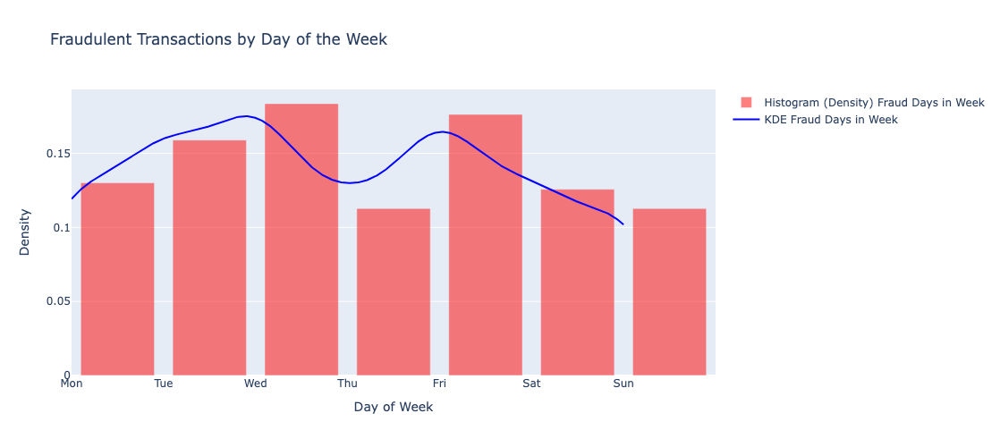

In [14]:
# Step 1: Extract number of fraud transactions data that happened during weekdays and weekend
## We drop the missing time transaction to get clearer picture from the distribution based on the complete and valid transaction data
fraud_days = df_cleaned[df_cleaned['is_fraud'] == 1]['day_of_week'].dropna()

# Step 2: Kernel Density Estimation setup
kde_fraud_days = gaussian_kde(fraud_days)

# Step 3: Visualize using KDE and Histogram plot
x_week_range = np.linspace(0, 6, 500) #assumptions: 7 days a week (0 = Mon, 1 = Tue, ..., 6 = Sun)

## == Fraud Days ==
density_fraud_days = kde_fraud_days(x_week_range)
hist_vals_fraud_days, hist_edges_fraud_days = np.histogram(fraud_days, bins=7, range=(0, 7), density=True)
hist_x_fraud_days = 0.5 * (hist_edges_fraud_days[1:] + hist_edges_fraud_days[:-1])  # bin centers

fig = go.Figure()

# Plot normalized histogram (density)
fig.add_trace(go.Bar(
    x=hist_x_fraud_days,
    y=hist_vals_fraud_days,
    name='Histogram (Density) Fraud Days in Week',
    marker_color='red',
    opacity=0.5
))

# Plot KDE
fig.add_trace(go.Scatter(
    x=x_week_range,
    y=density_fraud_days,
    name='KDE Fraud Days in Week',
    mode='lines',
    line=dict(color='blue')
))

fig.update_layout(
    title='Fraudulent Transactions by Day of the Week',
    xaxis=dict(
        title='Day of Week',
        tickmode='array',
        tickvals=[0, 1, 2, 3, 4, 5, 6],
        ticktext=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    ),
    yaxis_title='Density',
    barmode='overlay',
    width=900,
    height=500
)

fig.show()

In [15]:
# Total transactions per day
transactions_per_day = df_cleaned['day_of_week'].value_counts().sort_index()

# Fraud transactions per day
fraud_days = df_cleaned.loc[df_cleaned['is_fraud'] == 1, 'day_of_week']
fraud_counts = fraud_days.value_counts().sort_index()

day_names = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
transactions_per_day.index = day_names
fraud_counts.index = day_names

fraud_ratio_days_df = pd.DataFrame({
    'Total_Transactions_Per_Day': transactions_per_day,
    'Fraud_Transactions_Per_Day': fraud_counts
})

# Calculate fraud rate (in %)
fraud_ratio_days_df['Fraud_Rate'] = np.round((fraud_ratio_days_df['Fraud_Transactions_Per_Day'] / fraud_ratio_days_df['Total_Transactions_Per_Day'])*100)
fraud_ratio_days_df

,Total_Transactions_Per_Day,Fraud_Transactions_Per_Day,Fraud_Rate
Mon,762,90,12.0
Tue,824,110,13.0
Wed,410,127,31.0
Thu,495,78,16.0
Fri,867,122,14.0
Sat,454,87,19.0
Sun,545,78,14.0


<b> Team Analysis <b/>:
- Based on the density plots, fraudulent transactions occur fairly evenly throughout the week, but there is a noticeable concentration during weekdays, with prominent peaks on Tuesday, Wednesday, and Friday.
- In relative to number of transactions per day, highest fraud ratio is occured during Wednesday despite having the lowest overall transaction volume among weekdays. This could indicate that fraudsters deliberately target low activity periods, possibly because merchants and monitoring systems are less vigilant, making it easier to carry out fraudulent actions undetected.

#### 2.1.3: Fraud Transactions by Merchant Category

Main question: <b> Which merchant categories have the most fraudulent transactions? </b>

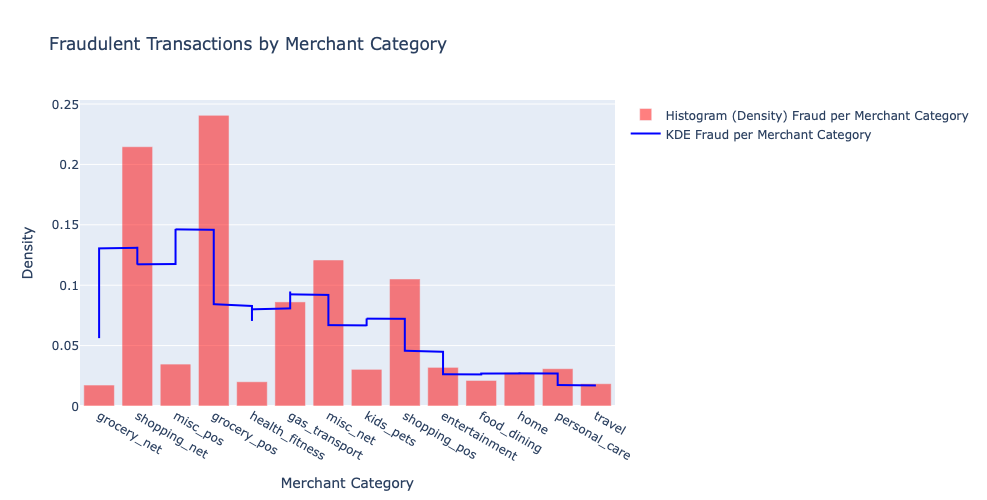

In [17]:
# Step 1: Extract data of fraud transactions based on the merchant type
df_cleaned['merchant_category'] = df['category'].copy()
df_cleaned['merchant_category'].unique()

# Step 2: Map categories to integers for KDE analysis
category_mapping = {cat: idx for idx, cat in enumerate(df_cleaned['merchant_category'].dropna().unique())}
category_inverse = {v: k for k, v in category_mapping.items()}

## We drop the missing time transaction to get clearer picture from the distribution based on the complete and valid transaction data
fraud_categories = df_cleaned[df_cleaned['is_fraud'] == 1]['merchant_category'].dropna()
fraud_category_encoded = fraud_categories.map(category_mapping)

# Step 3: Kernel Density Estimation setup
kde_fraud_category = gaussian_kde(fraud_category_encoded)

# Step 4: Visualize using KDE and Histogram plot
x_cat_range = np.linspace(fraud_category_encoded.min(), fraud_category_encoded.max(), 500)
density_fraud_cat = kde_fraud_category(x_cat_range)

hist_vals_fraud_cat, hist_edges_fraud_cat = np.histogram(fraud_category_encoded, bins=len(category_mapping), 
                                                         range=(0, len(category_mapping)), density=True)
hist_x_fraud_cat = 0.5 * (hist_edges_fraud_cat[1:] + hist_edges_fraud_cat[:-1])  # bin centers

fig = go.Figure()

# Plot normalized histogram (density)
fig.add_trace(go.Bar(
    x=[category_inverse[int(i)] for i in hist_x_fraud_cat],
    y=hist_vals_fraud_cat,
    name='Histogram (Density) Fraud per Merchant Category',
    marker_color='red',
    opacity=0.5
))

# Plot KDE
fig.add_trace(go.Scatter(
    x=[category_inverse[int(i)] for i in x_cat_range],
    y=density_fraud_cat,
    name='KDE Fraud per Merchant Category',
    mode='lines',
    line=dict(color='blue')
))

fig.update_layout(
    title='Fraudulent Transactions by Merchant Category',
    xaxis_title='Merchant Category',
    yaxis_title='Density',
    barmode='overlay',
    width=1000,
    height=500
)

fig.show()

In [18]:
# Total transactions per merchant category
transactions_per_cat = df_cleaned['merchant_category'].value_counts().sort_index()

# Fraud transactions per category
fraud_per_cat = df_cleaned.loc[df_cleaned['is_fraud'] == 1]['merchant_category'].value_counts()

fraud_ratio_cat_df = pd.DataFrame({
    'Total_Transactions_Per_Cat': transactions_per_cat,
    'Fraud_Transactions_Per_Cat': fraud_per_cat
})

# Calculate fraud rate (in %)
fraud_ratio_cat_df['Fraud_Rate'] = np.round((fraud_ratio_cat_df['Fraud_Transactions_Per_Cat'] / fraud_ratio_cat_df['Total_Transactions_Per_Cat'])*100)
fraud_ratio_cat_df.sort_values(by='Fraud_Rate', ascending=False)

,Total_Transactions_Per_Cat,Fraud_Transactions_Per_Cat,Fraud_Rate
merchant_category,,,
grocery_pos,1602,444,28.0
shopping_net,1408,396,28.0
misc_net,821,223,27.0
shopping_pos,1354,194,14.0
gas_transport,1430,159,11.0
travel,385,34,9.0
misc_pos,823,64,8.0
grocery_net,474,32,7.0
entertainment,953,59,6.0


<b> Team Analysis <b/>:
- Based on the density plots, we could see that online shopping or e-commerce (shopping_net), offline groceries (groceries_pos / point of sale), and other online transactions (misc_net) exhibit the highest concentration of fraudulent activity across merchant categories.
- This suggests that fraud transactions would disproportionately target credit card purchase from online platform which does not have pyhsical present credit purchase (e.g., CDC machine on offline stores). Hence, these online purchase might prone to have weaker security system regarding the payment authentication with less human control
- Furthermore, groceries as the second merchant type with large fraudulent transactions could be due to the nature of this purchase is considered as necessities goods. Therefore, the high-volume on these routine transactions would make fraud is harder to be identified and often merchant system would prioritize on the speed of the purchasing process vs verification process (i.e., fraud velocity tactics)

#### 2.1.4: Fraud Transactions by Credit Transactions Amount

Main question: <b> What are typical transactions amount that likely to be fraudulent transactions target ? </b>

In [19]:
# To analyze based on transactions amount, need to find the min and max values
df_cleaned['amt'].sort_values(ascending=False)

5148     3261.47
8140     3178.51
3763     3154.76
10451    2612.14
7432     2416.72
          ...   
9622        1.01
2283        1.01
7625        1.01
12572       1.01
4769        1.00
Name: amt, Length: 14446, dtype: float64

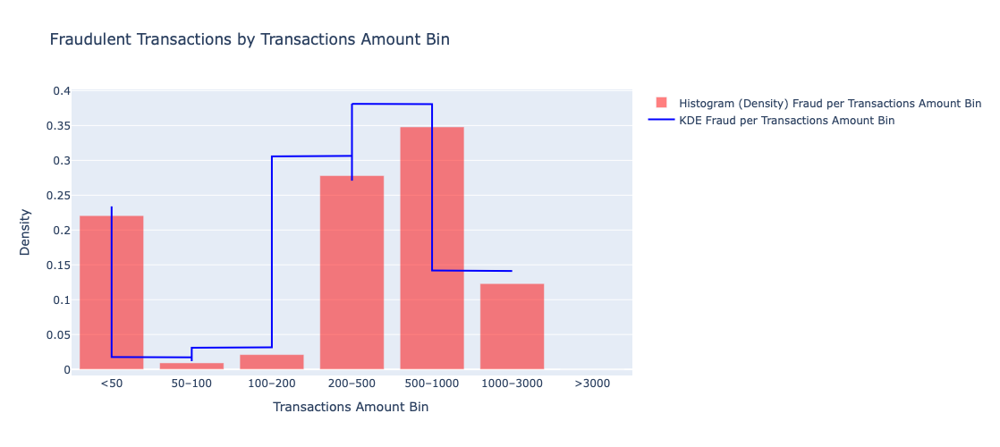

In [20]:
# Step 1: Create new custom bins for transactions amount
transaction_bins = [0, 50, 100, 200, 500, 1000, 3000, np.inf]
transactions_labels = ['<50', '50–100', '100–200', '200–500', '500–1000', '1000–3000', '>3000']
df_cleaned['amount_bin'] = pd.cut(df_cleaned['amt'], bins=transaction_bins, labels=transactions_labels, right=False)
category_bin_inverse = dict(enumerate(transactions_labels)) # to map bin index to label

# Step 2: Extract data of fraud transactions based on the transaction amount bins
## We drop the missing time transaction to get clearer picture from the distribution based on the complete and valid transaction data
fraud_amt_bin = df_cleaned[df_cleaned['is_fraud'] == 1]['amount_bin'].dropna()

# Step 3: Kernel Density Estimation setup
fraud_amt_numeric = fraud_amt_bin.cat.codes  # convert categorical bin into numerical (i.e., 0 for <50, 1 for 50-100, etc)
kde_fraud_bin = gaussian_kde(fraud_amt_numeric)

# Step 4: Visualize using KDE and Histogram plot
x_bin_range = np.linspace(fraud_amt_numeric.min(), fraud_amt_numeric.max(), 500)
density_fraud_bin = kde_fraud_bin(x_bin_range)

hist_vals_fraud_bin, hist_edges_fraud_bin = np.histogram(fraud_amt_numeric, bins=len(transactions_labels), 
                                                         range=(0, len(transactions_labels)), density=True)
hist_x_fraud_bin = 0.5 * (hist_edges_fraud_bin[1:] + hist_edges_fraud_bin[:-1])  # bin centers

fig = go.Figure()

# Plot normalized histogram (density)
fig.add_trace(go.Bar(
    x=[category_bin_inverse[int(i)] for i in hist_x_fraud_bin],
    y=hist_vals_fraud_bin,
    name='Histogram (Density) Fraud per Transactions Amount Bin',
    marker_color='red',
    opacity=0.5
))

# Plot KDE
fig.add_trace(go.Scatter(
    x=[category_bin_inverse[int(i)] for i in x_bin_range],
    y=density_fraud_bin,
    name='KDE Fraud per Transactions Amount Bin',
    mode='lines',
    line=dict(color='blue')
))

fig.update_layout(
    title='Fraudulent Transactions by Transactions Amount Bin',
    xaxis_title='Transactions Amount Bin',
    yaxis_title='Density',
    barmode='overlay',
    width=1000,
    height=500
)

fig.show()

In [21]:
# Total transactions per transactions bin category
transactions_per_bin = df_cleaned['amount_bin'].value_counts().sort_index()

# Fraud transactions per transactions bin category
fraud_per_bin = df_cleaned.loc[df_cleaned['is_fraud'] == 1]['amount_bin'].value_counts()

fraud_ratio_bin_df = pd.DataFrame({
    'Total_Transactions_Per_Amt_Bin': transactions_per_bin,
    'Fraud_Transactions_Per_Amt_Bin': fraud_per_bin
})

# Calculate fraud rate (in %)
fraud_ratio_bin_df['Fraud_Rate'] = np.round((fraud_ratio_bin_df['Fraud_Transactions_Per_Amt_Bin'] / fraud_ratio_bin_df['Total_Transactions_Per_Amt_Bin'])*100)
fraud_ratio_bin_df.sort_values(by='Fraud_Rate', ascending=False)

,Total_Transactions_Per_Amt_Bin,Fraud_Transactions_Per_Amt_Bin,Fraud_Rate
amount_bin,,,
1000–3000,255,227,89.0
500–1000,731,642,88.0
200–500,964,513,53.0
<50,7070,407,6.0
100–200,1701,39,2.0
50–100,3722,17,0.0
>3000,3,0,0.0


<b> Team Analysis <b/>:
- Based on the density plots, we observe that transaction amounts falling in the bins '200–500' and '500–1000' have the most frequent fraud transactions. This finding aligns with the fraud rates of 53% and 88% for these bins, respectively.
- However, despite the fraud rate for the small transaction amount bin '<50' being relatively low, the density plot shows a high distribution. This occurs because the density plot only visualizes the distribution of fraud transactions within bins. Since fraud transactions are more clustered in the '<50' bin, the density appears high.
- Moreover, the fraud rate is calculated as the proportion of fraud transactions to total transactions within the same bin. A low fraud rate in the '<50' bin indicates that the total number of transactions in this bin is very large compared to fraud transactions, leading to a low relative fraud ratio despite high absolute counts.

#### 2.1.5: Fraud Transactions by Credit Card Holder Age

Main question: <b> How does the age distribution differ between fraudulent and non-fraudulent transactions? Are certain age groups more prone to fraud? </b>

In [22]:
# To analyze based on credit card holder age, need to find the unique age values
df_cleaned['age'].unique()

array([86, 60, 70, 90, 33, 29, 65, 85, 34, 44, 87, 96, 98, 61, 49, 37, 71,
       40, 32, 41, 88, 58, 52, 83, 30, 56, 93, 97, 36, 69, 74, 51, 55, 59,
       62, 43, 54, 57, 89, 68, 66])

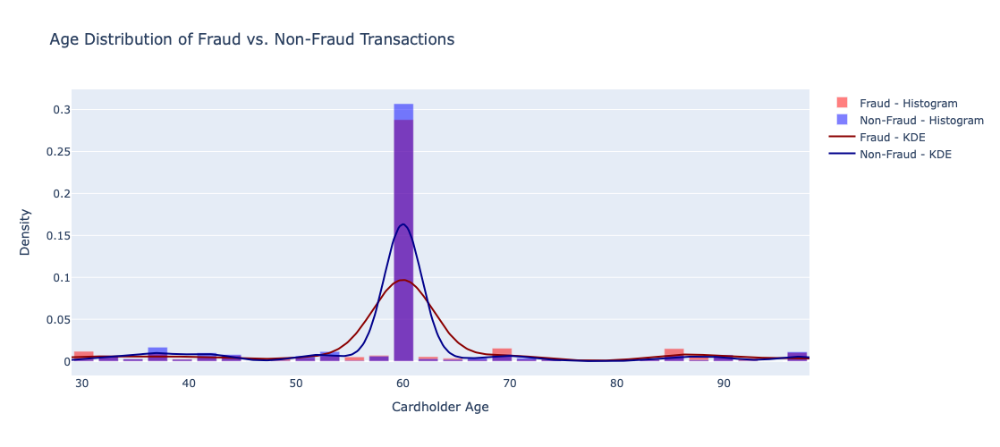

In [23]:
# Step 1: Extract the age data for each fraud and non-fraud category
## We drop the missing time transaction to get clearer picture from the distribution based on the complete and valid transaction data
fraud_ages = df_cleaned[df_cleaned['is_fraud'] == 1]['age'].dropna()
non_fraud_ages = df_cleaned[df_cleaned['is_fraud'] == 0]['age'].dropna()

# Step 2: Kernel Density Estimation setup
kde_fraud_age = gaussian_kde(fraud_ages)
kde_non_fraud_age = gaussian_kde(non_fraud_ages)

# Step 3: Visualize using KDE and Histogram plot
x_age_range = np.linspace(min(df_cleaned['age']), max(df_cleaned['age']), 500)

## == Fraud transactions ==
density_fraud = kde_fraud_age(x_age_range)
hist_fraud, hist_edges_fraud = np.histogram(fraud_ages, bins=30, range=(df_cleaned['age'].min(), df_cleaned['age'].max()), density=True)

## == Non-Fraud transactions ==
density_non_fraud = kde_non_fraud_age(x_age_range)
hist_non_fraud, hist_edges_non_fraud = np.histogram(non_fraud_ages, bins=30, range=(df_cleaned['age'].min(), df_cleaned['age'].max()), density=True)

hist_x_age_centers = 0.5 * (hist_edges_fraud[1:] + hist_edges_fraud[:-1])

fig = go.Figure()

# Plot normalized histogram (density)
fig.add_trace(go.Bar(
    x=hist_x_age_centers,
    y=hist_fraud,
    name='Fraud - Histogram',
    marker_color='red',
    opacity=0.5
))

fig.add_trace(go.Bar(
    x=hist_x_age_centers,
    y=hist_non_fraud,
    name='Non-Fraud - Histogram',
    marker_color='blue',
    opacity=0.5
))

# Plot KDE
fig.add_trace(go.Scatter(
    x=x_age_range,
    y=density_fraud,
    mode='lines',
    name='Fraud - KDE',
    line=dict(color='darkred')
))

fig.add_trace(go.Scatter(
    x=x_age_range,
    y=density_non_fraud,
    mode='lines',
    name='Non-Fraud - KDE',
    line=dict(color='darkblue')
))

fig.update_layout(
    title='Age Distribution of Fraud vs. Non-Fraud Transactions',
    xaxis_title='Cardholder Age',
    yaxis_title='Density',
    barmode='overlay',
    width=900,
    height=500
)

fig.show()

In [24]:
# Total transactions per age category
transactions_per_age = df_cleaned['age'].value_counts().sort_index()

# Fraud transactions per age category
fraud_per_age = df_cleaned.loc[df_cleaned['is_fraud'] == 1]['age'].value_counts()

fraud_ratio_age_df = pd.DataFrame({
    'Total_Transactions_Per_Age': transactions_per_age,
    'Fraud_Transactions_Per_Age': fraud_per_age
})

# Calculate fraud rate (in %)
fraud_ratio_age_df['Fraud_Rate'] = np.round((fraud_ratio_age_df['Fraud_Transactions_Per_Age'] / fraud_ratio_age_df['Total_Transactions_Per_Age'])*100)
fraud_ratio_age_df

,Total_Transactions_Per_Age,Fraud_Transactions_Per_Age,Fraud_Rate
age,,,
29,31,31.0,100.0
30,81,19.0,23.0
32,112,7.0,6.0
33,108,18.0,17.0
34,93,11.0,12.0
36,66,8.0,12.0
37,462,34.0,7.0
40,78,11.0,14.0
41,313,23.0,7.0


<b> Team Analysis <b/>:
- Based on the density plots, we see that the distribution for both fraud and non-fraud transactions peak around the age of 60. This suggests that cardholders in this age group are the most active in terms of transaction volume. In addition, the overlap in the fraud and non-fraud density curves implies that fraudsters do not disproportionately target specific age groups, but rather exploit age groups with higher overall transaction activity—in this case.
- This pattern could be indicative of an opportunistic fraud behavior, where fraud transactions are more likely to occur in segments with higher transaction traffic, since there may be higher chance in blending in to the 'noisy' transasctions volume and avoiding detection.

### Part 3: Model Building and Implementation

#### **3.1: Data Splitting**

Because our current data still has the imbalanced issue within the <b>'is_fraud'</b> class, therefore we should do the resampling method to balance the class distribution using SMOTE method. However, the method should only be applied to training dataset to represent real-world, imbalanced data and avoid any data leakage to the test dataset which could misinterpret our models' performance capability.

#### Data Preparation

In [25]:
df_cleaned.columns

Index(['trans_date_trans_time', 'merchant', 'category', 'amt', 'city', 'state',
       'lat', 'long', 'city_pop', 'job', 'dob', 'merch_lat', 'merch_long',
       'is_fraud', 'date', 'hour', 'day_of_week', 'is_weekend',
       'missing_time_flag', 'age', 'distance_km', 'merchant_category',
       'amount_bin'],
      dtype='object')

In [26]:
# Step 1: Split the dataset into X and Y variables
x_features = ['amt', 'distance_km',  'city', 'state', 'city_pop', # transaction amount and location features
            'hour','day_of_week','is_weekend','missing_time_flag',  # time features
           'age', 'job',  # credit holder demographic profiles
           'category','merchant','amount_bin'] # categorical features

X = df_cleaned[x_features]

## Using ordinal encoding for amount bin categorical data (since the order of data matters)
X['amount_bin'] = X['amount_bin'].cat.codes

Y = df_cleaned['is_fraud']

In [27]:
# Check whether the features have been in the correct data types
X.dtypes

amt                  float64
distance_km          float64
city                   int64
state                  int64
city_pop               int64
hour                 float64
day_of_week          float64
is_weekend             int64
missing_time_flag      int64
age                    int64
job                    int64
category               int64
merchant               int64
amount_bin              int8
dtype: object

#### Data Resampling

In [28]:
# Step 2: Split dataset into train and temp (validation + test) dataset (using 70:15:15 rule)
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, stratify=Y, test_size=0.3, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, stratify=Y_temp, test_size=0.5, random_state=42) # 15% validation and 15% test 

# Step 3: Impute missing values in the X variables
imputer = SimpleImputer(strategy='median')  # or 'median', 'most_frequent'
X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train.columns)
X_val_imputed = pd.DataFrame(imputer.transform(X_val), columns=X_val.columns)
X_test_imputed = pd.DataFrame(imputer.transform(X_test), columns=X_test.columns)

# Step 4: Apply SMOTE resampling method (strictly applied only to training dataset)
smote = SMOTE(random_state=42)
X_train_smote, Y_train_smote = smote.fit_resample(X_train_imputed, Y_train)

## Apply back to dataframe 
X_train_smote = pd.DataFrame(X_train_smote, columns=X_train.columns)
Y_train_smote = pd.Series(Y_train_smote, name=Y_train.name)

# Step 5: Feature scaling (to make sure that all features contribute equally to model, not impacted by the scale differential)
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_smote), columns=X_train_smote.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val_imputed), columns=X_val.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test_imputed), columns=X_test.columns)

In [29]:
# Check whether Y variable data is already balanced
display(X_train_scaled.head())
Y_train_smote.value_counts()

,amt,distance_km,city,state,city_pop,hour,day_of_week,is_weekend,missing_time_flag,age,job,category,merchant,amount_bin
0,-0.656946,1.280281,-1.715005,-0.892029,0.028359,0.051228,0.042346,-0.31451,0.759647,-0.008109,0.310981,-0.723492,-0.102845,-0.450700
1,-0.146055,-0.921747,1.325732,-1.187184,-0.196750,0.051228,0.042346,-0.31451,0.759647,-0.008109,-1.711218,-0.723492,0.552039,0.720418
2,-0.637234,-1.689663,0.974082,-0.006563,-0.370800,0.051228,0.042346,-0.31451,0.759647,-0.008109,1.555411,-1.260452,0.367193,-0.450700
3,-0.584484,1.378651,0.332838,-0.006563,-0.371517,0.051228,0.042346,-0.31451,0.759647,-0.008109,-0.733452,-0.991972,-0.805261,-0.450700
4,0.651592,-1.502552,-0.618685,0.288592,-0.373402,0.051228,0.042346,-0.31451,0.759647,3.265715,1.288748,0.618907,0.900606,1.305977


is_fraud
0    8821
1    8821
Name: count, dtype: int64

#### **3.2 Supervised Learning: Fraud Detection**

<b> Purpose </b>: 
- To leverage historical labeled data to build a predictive model that classifies transactions as fraudulent or legitimate.

<b> Method </b>: 
- Obtain the training (for model training), validation (for hyperparameter tuning and handle overfitting issue), and test dataset (for model performance assessment)
- Train models on the labeled data using several models, including Decision Tree, Random Forest, XGBoost
- Evaluate models prediction result using metrics performance (Precision, Recall, F1, ROC-AUC)
- Tune threshold using business cost logic

In [30]:
# Function for model evaluation
def evaluate_model(model, X_val, y_val, X_test, y_test):
    y_pred_val = model.predict(X_val)
    y_proba_val = model.predict_proba(X_val)[:, 1] if hasattr(model, "predict_proba") else None

    y_pred_test = model.predict(X_test)
    y_proba_test = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    labels = ['Not Fraud', 'Fraud']

    # --- Validation Set ---
    cm_val = confusion_matrix(y_val, y_pred_val)
    acc_val = accuracy_score(y_val, y_pred_val)
    prec_val = precision_score(y_val, y_pred_val)
    rec_val = recall_score(y_val, y_pred_val)
    f1_val = f1_score(y_val, y_pred_val)
    roc_val = roc_auc_score(y_val, y_proba_val) if y_proba_val is not None else None

    print("=== Validation Set Performance ===\n")
    print("Confusion Matrix:\n", cm_val)
    print("\nClassification Report:\n", classification_report(y_val, y_pred_val))
    print("Accuracy:", acc_val)
    print("Precision:", prec_val)
    print("Recall:", rec_val)
    print("F1 Score:", f1_val)
    if roc_val is not None:
        print("ROC AUC Score:", roc_val)
        
    # --- Test Set ---
    cm_test = confusion_matrix(y_test, y_pred_test)
    acc_test = accuracy_score(y_test, y_pred_test)
    prec_test = precision_score(y_test, y_pred_test)
    rec_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_test = roc_auc_score(y_test, y_proba_test) if y_proba_test is not None else None

    print("\n=== Test Set Performance ===\n")
    print("Confusion Matrix:\n", cm_test)
    print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
    print("Accuracy:", acc_test)
    print("Precision:", prec_test)
    print("Recall:", rec_test)
    print("F1 Score:", f1_test)
    if roc_test is not None:
        print("ROC AUC Score:", roc_test)

    # --- Plot Confusion Matrices Side by Side ---
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=(
            f"Validation Set<br>Acc: {acc_val:.2f}, Prec: {prec_val:.2f}, Rec: {rec_val:.2f}, F1: {f1_val:.2f}",
            f"Test Set<br>Acc: {acc_test:.2f}, Prec: {prec_test:.2f}, Rec: {rec_test:.2f}, F1: {f1_test:.2f}"
        )
    )

    # Validation Heatmap
    fig.add_trace(go.Heatmap(
        z=cm_val,
        x=labels,
        y=labels,
        colorscale='Blues',
        showscale=True,
        hovertemplate='Predicted: %{x}<br>Actual: %{y}<br>Count: %{z}<extra></extra>'
    ), row=1, col=1)

    # Test Heatmap
    fig.add_trace(go.Heatmap(
        z=cm_test,
        x=labels,
        y=labels,
        colorscale='Blues',
        showscale=True,
        hovertemplate='Predicted: %{x}<br>Actual: %{y}<br>Count: %{z}<extra></extra>'
    ), row=1, col=2)

    fig.update_layout(
        title_text="Confusion Matrix: Validation vs Test",
        width=1000,
        height=500
    )

    fig.update_xaxes(title_text="Predicted Label", row=1, col=1)
    fig.update_xaxes(title_text="Predicted Label", row=1, col=2)
    fig.update_yaxes(title_text="True Label", row=1, col=1)
    fig.update_yaxes(title_text="True Label", row=1, col=2)

    fig.show()

#### 3.2.1 Model 1: Decision Tree

=== Validation Set Performance ===

Confusion Matrix:
 [[1839   51]
 [  30  247]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98      1890
           1       0.83      0.89      0.86       277

    accuracy                           0.96      2167
   macro avg       0.91      0.93      0.92      2167
weighted avg       0.96      0.96      0.96      2167

Accuracy: 0.9626211352099677
Precision: 0.8288590604026845
Recall: 0.8916967509025271
F1 Score: 0.8591304347826086
ROC AUC Score: 0.9323563119592

=== Test Set Performance ===

Confusion Matrix:
 [[1836   54]
 [  38  239]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98      1890
           1       0.82      0.86      0.84       277

    accuracy                           0.96      2167
   macro avg       0.90      0.92      0.91      2167
weighted avg       0.96      0.96      0.96   

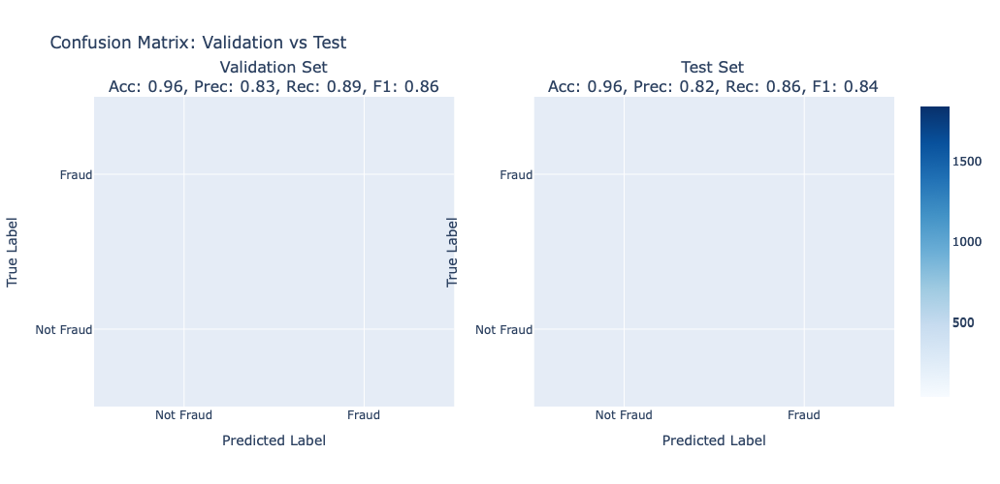

In [31]:
# Step 1: Develop model using train data
dt_model = DecisionTreeClassifier(random_state=42)

# Step 2: Fit models into oversampled / balanced training dataset
dt_model.fit(X_train_scaled, Y_train_smote)

# Step 3: Generate the prediction using the validation and test dataset
## == Validation set == 
dt_val_preds = dt_model.predict(X_val_scaled)
dt_val_proba = dt_model.predict_proba(X_val_scaled)[:, 1]

## == Test set == 
dt_test_preds = dt_model.predict(X_test_scaled)
dt_test_proba = dt_model.predict_proba(X_test_scaled)[:, 1]

# Step 4: Evaluate the model performance
df_model_evaluation = evaluate_model(dt_model, X_val_scaled, Y_val, X_test_scaled, Y_test)
df_model_evaluation

<b> Team Analysis: </b>:
1. <i><b> Accuracy </i> :
The Decision Tree model achieves an accuracy of approximately 96% on both the validation and test sets. This indicates that the model correctly classifies the vast majority of transactions overall.

2. <i><b> Precision </i>:
For the fraud class, around 83% of transactions predicted as fraud are indeed fraudulent. This means the model produces relatively few false positives, which is crucial for minimizing disruption to legitimate customers. A high precision helps financial institutions reduce "noise" from unnecessary investigations into non-fraudulent activities.

3. <i><b> Recall </i>:
The model captures 86–89% of actual fraud cases, meaning only 11–14% are missed. This strong recall suggests the model is effective at identifying fraudulent transactions, which is essential for minimizing financial loss.

4. <i><b> F1 Score </i>:
The F1 score, as the harmonic mean of precision and recall, indicates a good balance between detecting fraud (recall) and minimizing false positives (precision). This balance is important in high-stakes domains like fraud detection.

5. <i><b> ROC-AUC Score </i>:
The high ROC-AUC scores (~0.91–0.93) reflect a strong ability of the model to distinguish between fraudulent and non-fraudulent transactions. This further supports the model’s robustness and reliability.

#### 3.2.2 Model 2: Random Forest Classifier

=== Validation Set Performance ===

Confusion Matrix:
 [[1861   29]
 [  33  244]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      1890
           1       0.89      0.88      0.89       277

    accuracy                           0.97      2167
   macro avg       0.94      0.93      0.94      2167
weighted avg       0.97      0.97      0.97      2167

Accuracy: 0.9713890170742963
Precision: 0.8937728937728938
Recall: 0.8808664259927798
F1 Score: 0.8872727272727273
ROC AUC Score: 0.9826208622237503

=== Test Set Performance ===

Confusion Matrix:
 [[1866   24]
 [  45  232]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      1890
           1       0.91      0.84      0.87       277

    accuracy                           0.97      2167
   macro avg       0.94      0.91      0.93      2167
weighted avg       0.97      0.97      0.97

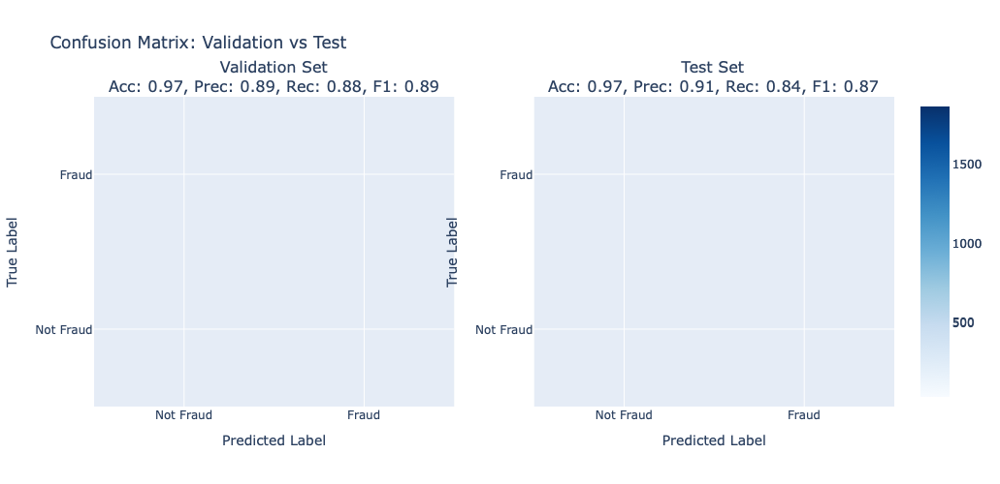

In [32]:
# Step 1: Develop model using train data
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Step 2: Fit models into oversampled / balanced training dataset
rf_model.fit(X_train_scaled, Y_train_smote)

# Step 3: Generate the prediction using the validation and test dataset
## == Validation set == 
rf_val_preds = rf_model.predict(X_val_scaled)
rf_val_proba = rf_model.predict_proba(X_val_scaled)[:, 1]

## == Test set == 
rf_test_preds = rf_model.predict(X_test_scaled)
rf_test_proba = rf_model.predict_proba(X_test_scaled)[:, 1]

# Step 4: Evaluate the model performance
rf_model_evaluation = evaluate_model(rf_model, X_val_scaled, Y_val, X_test_scaled, Y_test)
rf_model_evaluation

<b> Team Analysis: </b>:
1. <i><b> Accuracy </i> :
The Random Forest model achieves an accuracy of approximately 97% on both the validation and test sets. This indicates that the model correctly classifies the vast majority of transactions overall.

2. <i><b> Precision </i>:
For the fraud class, around 89-91% of transactions predicted as fraud are indeed fraudulent. This means the model produces relatively few false positives, which is crucial for minimizing disruption to legitimate customers. A high precision helps financial institutions reduce "noise" from unnecessary investigations into non-fraudulent activities.

3. <i><b> Recall </i>:
The model captures 84–88% of actual fraud cases, meaning only 12–16% are missed. This strong recall suggests the model is effective at identifying fraudulent transactions, which is essential for minimizing financial loss.

4. <i><b> F1 Score </i>:
The F1 score, as the harmonic mean of precision and recall, indicates a good balance between detecting fraud (recall) and minimizing false positives (precision). This balance is important in high-stakes domains like fraud detection.

5. <i><b> ROC-AUC Score </i>:
The high ROC-AUC scores (~0.98) reflect a strong ability of the model to distinguish between fraudulent and non-fraudulent transactions. This further supports the model’s robustness and reliability.

#### 3.2.3 Model 3: XGBoost Classifier

=== Validation Set Performance ===

Confusion Matrix:
 [[1871   19]
 [  29  248]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      1890
           1       0.93      0.90      0.91       277

    accuracy                           0.98      2167
   macro avg       0.96      0.94      0.95      2167
weighted avg       0.98      0.98      0.98      2167

Accuracy: 0.9778495616059067
Precision: 0.9288389513108615
Recall: 0.8953068592057761
F1 Score: 0.9117647058823529
ROC AUC Score: 0.9872566997115733

=== Test Set Performance ===

Confusion Matrix:
 [[1873   17]
 [  39  238]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      1890
           1       0.93      0.86      0.89       277

    accuracy                           0.97      2167
   macro avg       0.96      0.93      0.94      2167
weighted avg       0.97      0.97      0.97

/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning:

[15:49:53] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




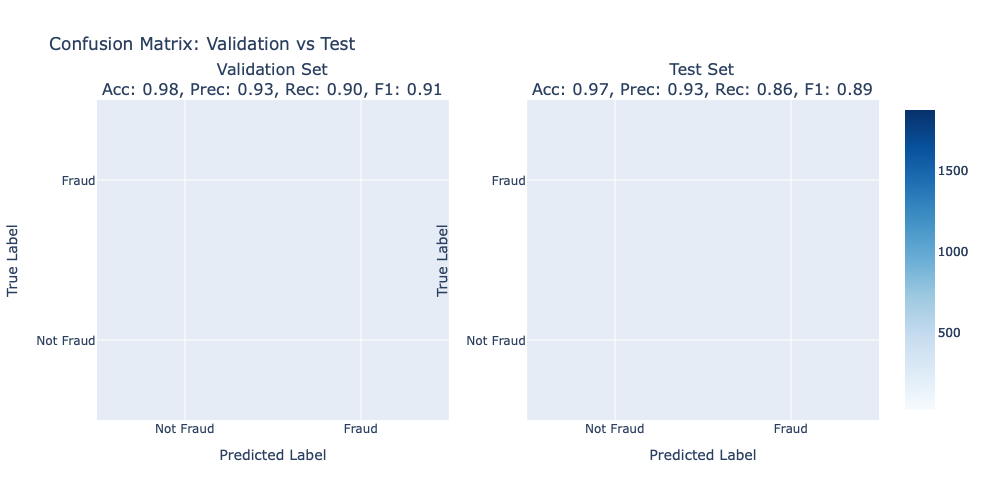

In [33]:
# Step 1: Develop model using train data
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss',
                          random_state=42)

# Step 2: Fit models into oversampled / balanced training dataset
xgb_model.fit(X_train_scaled, Y_train_smote)
            
# Step 3: Generate the prediction using the validation and test dataset
## == Validation set == 
xgb_val_preds = xgb_model.predict(X_val_scaled)
xgb_val_proba = xgb_model.predict_proba(X_val_scaled)[:, 1]

## == Test set == 
xgb_test_preds = xgb_model.predict(X_test_scaled)
xgb_test_proba = xgb_model.predict_proba(X_test_scaled)[:, 1]

# Step 4: Evaluate the model performance
xgb_model_evaluation = evaluate_model(xgb_model, X_val_scaled, Y_val, X_test_scaled, Y_test)
xgb_model_evaluation

<b> Team Analysis: </b>:
1. <i><b> Accuracy </i> :
The XGBoost model achieves an accuracy of approximately 97% on both the validation and test sets. This indicates that the model correctly classifies the vast majority of transactions overall.

2. <i><b> Precision </i>:
For the fraud class, around 93% of transactions predicted as fraud are indeed fraudulent. This means the model produces relatively few false positives, which is crucial for minimizing disruption to legitimate customers. A high precision helps financial institutions reduce "noise" from unnecessary investigations into non-fraudulent activities.

3. <i><b> Recall </i>:
The model captures 86–90% of actual fraud cases, meaning only 10–14% are missed. This strong recall suggests the model is effective and highly sensitive in identifying fraudulent transactions, which is essential for minimizing financial loss.

4. <i><b> F1 Score </i>:
The F1 score, as the harmonic mean of precision and recall, indicates a good balance between detecting fraud (recall) and minimizing false positives (precision). This balance is important in high-stakes domains like fraud detection.

5. <i><b> ROC-AUC Score </i>:
The high ROC-AUC scores (~0.98) reflect a strong ability of the model to distinguish between fraudulent and non-fraudulent transactions. This further supports the model’s robustness and reliability.

#### **3.3 Unsupervised Learning: Anomaly Detection**

<b> Purpose </b>: 
- To identify transactions that significantly deviate from normal behavior, potentially revealing new or unseen fraud patterns in unlabeled data. Hence, we carry out anomaly detection procedures which is one of the machine learning technique that is useful in finding patterns in data that do not align with the expected or regular behavior (anomalies). 

<b> Method </b>: 
- Obtain the feature matrix (X) variables dataset and target variable (Y) variable stand alone ('is_fraud') without any resampling modification process (e.g., SMOTE). This because the method essentialy creates synthetic fraud (minority class) sample into dataset to make it balance distribution, hence distorting the raw anomaly data structure which contrast to the procedure of unsupervised learning that use original data distribution
-  Train on legitimate transactions (or unlabeled data) and flag anomalies pattern found as potential fraud
-  Fit data using unsupervised model and generate predictions in form of anomaly score (confidence level of being an outlier) and anomaly flag for binary label prediction (i.e., 0 = normal, 1 = anomaly)

#### Data Preparation and Scaling

In [34]:
# Step 1: Define the X and Y variables
X_unsupervised = df_cleaned[x_features]
X_unsupervised['amount_bin'] = X_unsupervised['amount_bin'].astype('category')
X_unsupervised['amount_bin'] = X_unsupervised['amount_bin'].cat.codes
Y_unsupervised = df_cleaned['is_fraud']

# Step 2: Drop rows with missing values and align with y
X_unsupervised = X_unsupervised.dropna()
Y_unsupervised = Y_unsupervised.loc[X_unsupervised.index]

# Step 3: Feature scaling (to make sure that all features contribute equally to model, not impacted by the scale differential)
scaler = StandardScaler()
X_unsuper_scaled = scaler.fit_transform(X_unsupervised)

#### 3.3.1 Model 1: Isolation Forest


=== Isolation Forest Model Performance ===
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      3665
           1       0.74      0.23      0.35       692

    accuracy                           0.87      4357
   macro avg       0.81      0.61      0.64      4357
weighted avg       0.85      0.87      0.83      4357

Accuracy: 0.8650
Precision: 0.8506
Recall: 0.8650
F1 Score: 0.8340
ROC AUC Score: 0.8261


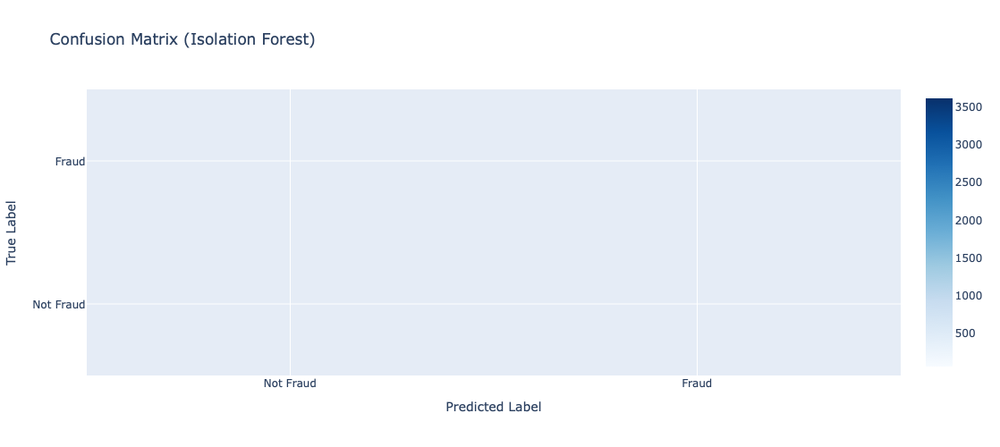

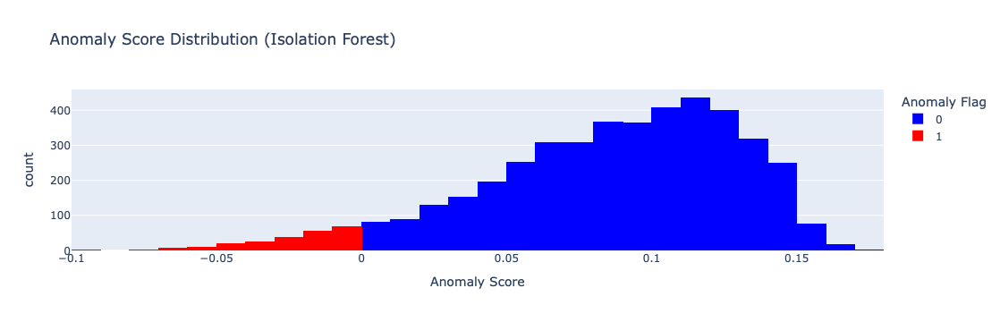

In [35]:
# Step 1: Develop model using original data
iso_model = IsolationForest(n_estimators=100, contamination=0.05, random_state=42) # assumptions: using 5% of anomalies expected

# Step 2: Fit models into original / unbalanced training dataset
iso_model.fit(X_unsuper_scaled)
            
# Step 3: Generate the prediction and anomaly score using the validation and test dataset and convert predictions to create flag anomalies
iso_preds = iso_model.predict(X_unsuper_scaled)
iso_scores = iso_model.decision_function(X_unsuper_scaled)
iso_df = pd.DataFrame(X_unsuper_scaled, columns=x_features, index=X_unsupervised.index)
iso_df['true_label'] = Y_unsupervised
iso_df['anomaly_score'] = iso_scores
iso_df['anomaly_flag'] = (iso_preds == -1).astype(int)

# Step 4: Evaluate the model performance
## Compute the metrics
iso_cm = confusion_matrix(iso_df['true_label'], iso_df['anomaly_flag'])
iso_acc = accuracy_score(iso_df['true_label'], iso_df['anomaly_flag'])
iso_prec = precision_score(iso_df['true_label'], iso_df['anomaly_flag'], average='weighted', zero_division=0)
iso_rec = recall_score(iso_df['true_label'], iso_df['anomaly_flag'], average='weighted', zero_division=0)
iso_f1 = f1_score(iso_df['true_label'], iso_df['anomaly_flag'], average='weighted', zero_division=0)
iso_roc = roc_auc_score(iso_df['true_label'], -iso_df['anomaly_score'])

## Print the summary
print(f"\n=== Isolation Forest Model Performance ===")
print("Classification Report:")
print(classification_report(iso_df['true_label'], iso_df['anomaly_flag'], zero_division=0))
print(f"Accuracy: {iso_acc:.4f}")
print(f"Precision: {iso_prec:.4f}")
print(f"Recall: {iso_rec:.4f}")
print(f"F1 Score: {iso_f1:.4f}")
print(f"ROC AUC Score: {iso_roc:.4f}")

iso_labels = ['Not Fraud', 'Fraud']

# Plot the confusion matrix
fig_cm = go.Figure(data=go.Heatmap(
    z=iso_cm,
    x=iso_labels,
    y=iso_labels,
    colorscale='Blues',
    showscale=True,
    hovertemplate='Predicted: %{x}<br>Actual: %{y}<br>Count: %{z}<extra></extra>'
))

fig_cm.update_layout(
    title='Confusion Matrix (Isolation Forest)',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    width=500,
    height=500
)
fig_cm.show()

# Plot the anomaly score distribution
fig_anomaly = px.histogram(
    iso_df,
    x='anomaly_score',
    color='anomaly_flag',
    nbins=50,
    title='Anomaly Score Distribution (Isolation Forest)',
    labels={'anomaly_score': 'Anomaly Score', 'anomaly_flag': 'Anomaly Flag'},
    color_discrete_map={0: 'blue', 1: 'red'}
)
fig_anomaly.show()

<b> Team Analysis: </b>:
1. <i><b> Accuracy </i> : The model achieves an accuracy of 86.5%, which might seem strong at first glance. However, due to the class imbalance (majority non-fraud), accuracy alone is not a reliable metric for evaluating fraud detection. A model could predict “non-fraud” for all transactions and still get high accuracy.

2. <i><b> Precision </i>:
- For the fraud class (label 1), precision is 74%, meaning that when the model flags a transaction as fraudulent, it's correct 74% of the time — suggesting a moderate false positive rate.
- For the non-fraud class (label 0), the precision is 87%, meaning 13% of predicted normal transactions were actually fraudulent - which is reflecting the real-world scenario.
  
3. <i><b> Recall </i>:
- The non-fraud class has very high recall score (98%), meaning the model rarely misses normal transactions.
- The fraud class has very low recall (23%), indicating the model misses 77% of actual frauds (false negatives). This happens because the model is conservative — it only flags fraud when it's very confident, reducing false positives at the cost of missed frauds.. 

4. <i><b> F1 Score </i>:
- The overall F1 score of 83.40% reflects a decent balance between precision and recall across all classes
- For fraud, the F1 score of 35%, reflecting the model's struggle to consistently detect fraud cases due to low recall score.
  
5. <i><b> ROC-AUC Score </i>: The ROC-AUC score of 82.6% shows that the model's strong ability to rank fraud cases higher than non-fraud ones, capturing meaningful anomaly patterns, even if the default threshold is conservative.

7. <i><b> Anomaly Score Distribution </i>:
- Fraudulent transactions (red) cluster at low anomaly scores (left side), indicating they were isolated quickly by the model — as expected.
- Normal transactions (blue) group at higher scores, reflecting their “normality” to the model.
- The clear separation on the distribution area suggesting that model has performed well in separating fraud vs non-fraud cases, which align with the Isolation Forest model framework that it will isolate the fraud data hence assign with lower score. However, some frauds might overlap with normal scores, which explains the low recall — these overlapping frauds are missed at the current threshold.

#### 3.3.2 Model 2: Auto Encoders

Auto Encoders is a deep learning method that learn to encode and decode normal data, thus enable the model itself to identify anomalous in new data that does not match with the learned data patterns. So when the model is being fed with fraudulent data, it will not able to reconstruct data accurately, yielding high reconstruction error. Therefore, this error could be used as our sign for anomalous transactions

137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step

=== Auto Encoder Model Performance ===
Classification Report:
              precision    recall  f1-score   support

           0       0.88      1.00      0.94      3665
           1       0.93      0.29      0.45       692

    accuracy                           0.88      4357
   macro avg       0.91      0.64      0.69      4357
weighted avg       0.89      0.88      0.86      4357

Accuracy: 0.8843
Precision: 0.8897
Recall: 0.8843
F1 Score: 0.8577
ROC AUC Score: 0.8517


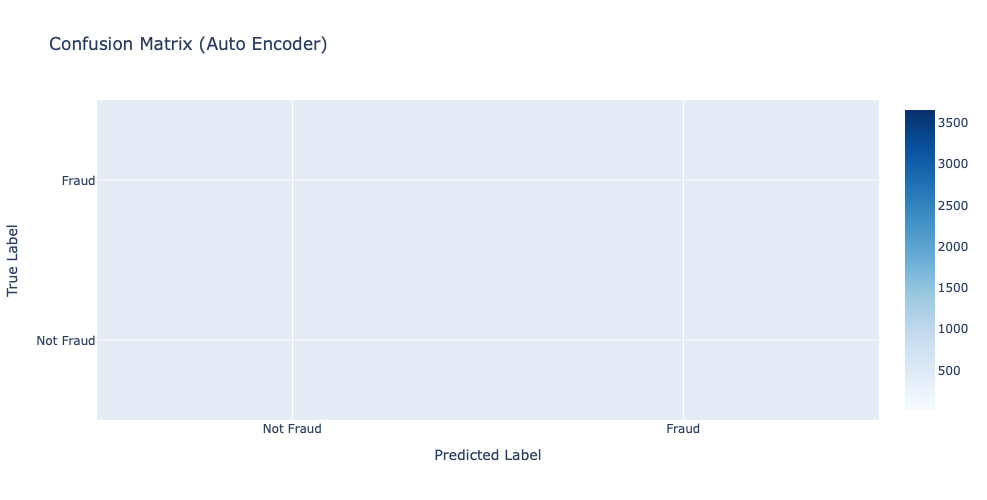

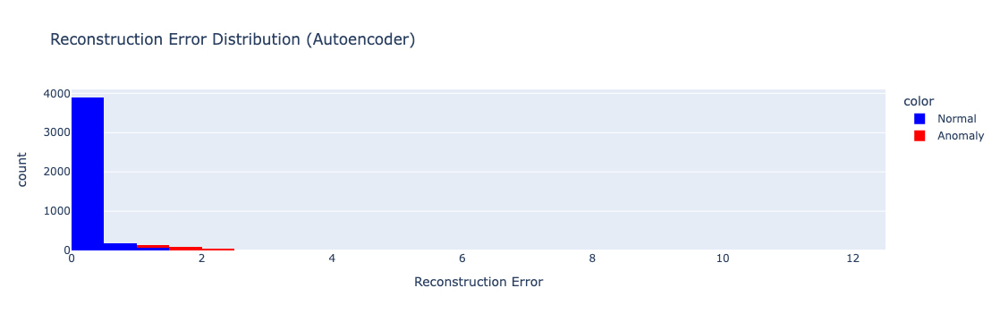

In [36]:
# Step 1: Develop model using original data (encoding step)
input_dim = X_unsuper_scaled.shape[1]

autoencoder = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(input_dim,)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(input_dim, activation='linear')
])

autoencoder.compile(optimizer='adam', loss='mse')

# Step 2: Train the model using normal data (non- fraud) only
X_train_auto = X_unsuper_scaled[Y_unsupervised == 0]  # only use non-fraud for training phase
autoencoder.fit(X_train_auto, X_train_auto, epochs=20, batch_size=64, shuffle=True, verbose=0) # the model input the x data, compress, and reconstruct the original input from the compressed data

# Step 3: Generate reconstruction errors predictions applied for all data (combination of fraud vs non-fraud data)
reconstructions = autoencoder.predict(X_unsuper_scaled)
reconstructions_error = np.mean(np.square(X_unsuper_scaled - reconstructions), axis=1)

# Step 4: Detect the anomalies using pre-defined threshold
threshold = np.percentile(reconstructions_error, 95)  # assumptions: top 5% of most anomalous 
pred_auto = (reconstructions_error > threshold).astype(int)

# Step 5: Evaluate the model performance
autoencoder_df = pd.DataFrame({
    'true_label': Y_unsupervised,
    'anomaly_flag': pred_auto,
    'reconstruction_error': reconstructions_error
})

## Compute the metrics
auto_cm = confusion_matrix(autoencoder_df['true_label'], autoencoder_df['anomaly_flag'])
auto_acc = accuracy_score(autoencoder_df['true_label'], autoencoder_df['anomaly_flag'])
auto_prec = precision_score(autoencoder_df['true_label'], autoencoder_df['anomaly_flag'], average='weighted', zero_division=0)
auto_rec = recall_score(autoencoder_df['true_label'], autoencoder_df['anomaly_flag'], average='weighted', zero_division=0)
auto_f1 = f1_score(autoencoder_df['true_label'], autoencoder_df['anomaly_flag'], average='weighted', zero_division=0)
auto_roc = roc_auc_score(autoencoder_df['true_label'], autoencoder_df['reconstruction_error'])

## Print the summary
print(f"\n=== Auto Encoder Model Performance ===")
print("Classification Report:")
print(classification_report(autoencoder_df['true_label'], autoencoder_df['anomaly_flag'], zero_division=0))
print(f"Accuracy: {auto_acc:.4f}")
print(f"Precision: {auto_prec:.4f}")
print(f"Recall: {auto_rec:.4f}")
print(f"F1 Score: {auto_f1:.4f}")
print(f"ROC AUC Score: {auto_roc:.4f}")

auto_labels = ['Not Fraud', 'Fraud']

# Plot the confusion matrix
fig_auto = go.Figure(data=go.Heatmap(
    z=auto_cm,
    x=auto_labels,
    y=auto_labels,
    colorscale='Blues',
    showscale=True,
    hovertemplate='Predicted: %{x}<br>Actual: %{y}<br>Count: %{z}<extra></extra>'
))

fig_auto.update_layout(
    title='Confusion Matrix (Auto Encoder)',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    width=500,
    height=500
)
fig_auto.show()

# Plot the error distribution histogram
fig_error = px.histogram(
    x=reconstructions_error,
    nbins=50,
    title='Reconstruction Error Distribution (Autoencoder)',
    labels={'x': 'Reconstruction Error'},
    color=pd.Series(pred_auto).map({0: 'Normal', 1: 'Anomaly'}),
    color_discrete_map={'Normal': 'blue', 'Anomaly': 'red'}
)
fig_error .show()

<b> Team Analysis: </b>:
1. <i><b> Accuracy </i> : The model achieves an overall accuracy of 88.5%, indicating it classifies the majority of transactions correctly. However, due to the class imbalance (i.e., most transactions are non-fraud), this metric can be misleading. A model predicting "non-fraud" for all cases could still show high accuracy without being effective at detecting fraud.

2. <i><b> Precision </i>:
- For the fraud class (label 1), precision is 94%, meaning that when the model flags a transaction as fraudulent, it's correct 94% of the time — a low false positive rate.
- For the non-fraud class (label 0), the precision is 88%, meaning 12% of predicted normal transactions were actually fraudulent. This still indicates solid performance in distinguishing the majority class.
  
3. <i><b> Recall </i>:
- The non-fraud class has perfect recall (100%), meaning the model never misses a genuine transaction — no false positives.
- The fraud class has low recall (29%), indicating it detects only 29% of actual fraud cases, while 71% are missed (false negatives). This is expected in autoencoders trained solely on normal data — they are not optimized to catch all types of anomalous patterns.

4. <i><b> F1 Score </i>:
- The overall F1 score of 85.83% reflects a decent balance between precision and recall.
- For fraud, the F1 score of 45% is modest due to the low recall. The model is cautious in predicting fraud and tends to miss subtle fraud cases, prioritizing precision over recall.
  
5. <i><b> ROC-AUC Score </i>: The ROC-AUC score of 85.05% shows that the model performs well in ranking transactions by their anomaly likelihood. It demonstrates strong discrimination capability, even though the classification threshold (top 5%) may limit recall.

7. <i><b> Anomaly Score Distribution </i>:
- Normal transactions (blue) cluster around low reconstruction errors due to effective learning from clean data.
- Fraudulent transactions (red) are more spread out across the reconstruction error axis. Some are clearly outliers (high error), but many blend with the normal cluster — explaining the low recall. This overlap means some frauds resemble normal data, making them harder to detect using reconstruction error alone.

### 3.4 Feature Importance Analysis

<b> Purpose <b/>: 
- To determine which features that influence the fraud predictions performance the most from each of the model 

#### Feature Importance Comparison Across Models

In [37]:
# Step 1: Generate the importance score from supervised learning model
## Model 1: Decision Tree
dt_importances = dt_model.feature_importances_
dt_df = pd.DataFrame({'Feature': X_train_scaled.columns, 'DT Importance': dt_importances})

## Model 2: Random Forest 
rf_importances = rf_model.feature_importances_
rf_df = pd.DataFrame({'Feature': X_train_scaled.columns, 'RF Importance': rf_importances})

## Model 3: XGBoost
xgb_importances = xgb_model.feature_importances_
xgb_df = pd.DataFrame({'Feature': X_train_scaled.columns, 'XGB Importance': xgb_importances})

# Step 2: Combine into one dataframe
merged_features_supervised = pd.merge(dt_df, rf_df, on='Feature')
merged_features_supervised = pd.merge(merged_features_supervised, xgb_df, on='Feature')
merged_features_supervised.columns = ['Feature', 'DT Importance', 'RF Importance', 'XGB Importance']
merged_features_supervised['Avg Importance'] = merged_features_supervised[['DT Importance', 'RF Importance', 'XGB Importance']].mean(axis=1)
merged_features = merged_features_supervised.sort_values(by='Avg Importance', ascending=False)
merged_features

,Feature,DT Importance,RF Importance,XGB Importance,Avg Importance
0,amt,0.624389,0.376133,0.260809,0.420444
13,amount_bin,0.141981,0.248290,0.244947,0.211739
8,missing_time_flag,0.020844,0.051514,0.228815,0.100391
11,category,0.127697,0.104012,0.066872,0.099527
5,hour,0.009405,0.025532,0.030414,0.021784
6,day_of_week,0.004451,0.030450,0.026856,0.020585
7,is_weekend,0.001507,0.009284,0.048009,0.019600
4,city_pop,0.013809,0.028377,0.014107,0.018764
10,job,0.014951,0.023679,0.012322,0.016984
9,age,0.004365,0.017724,0.025181,0.015757


In [38]:
# Define function for autoencoder feature importance using permutation importance based on reconstruction error (how much permuting it increases the reconstruction error)
def autoencoder_feature_importance(autoencoder, X_data, n_repeats=10, random_state=42):
    np.random.seed(random_state)
    baseline_recon = autoencoder.predict(X_data)
    baseline_error = np.mean(np.square(X_data - baseline_recon), axis=1)
    baseline_mse = np.mean(baseline_error)
    
    importances = []

    for i in range(X_data.shape[1]):
        feature_errors = []
        for _ in range(n_repeats):
            X_permuted = X_data.copy()
            X_permuted[:, i] = shuffle(X_permuted[:, i], random_state=random_state)
            recon = autoencoder.predict(X_permuted)
            error = np.mean(np.square(X_permuted - recon), axis=1)
            feature_errors.append(np.mean(error) - baseline_mse)
        importances.append(np.mean(feature_errors))
    
    return np.array(importances)

In [39]:
# Step 3: Generate the importance score from unsupervised learning model
## Model 1: Isolation Forest
isoforest_result = permutation_importance(
    iso_model, X_unsuper_scaled, Y_unsupervised, # Using true labels Y_unsupervised for pseudo-supervised feature importance evaluation.
    n_repeats=10,
    scoring='f1_macro',
    random_state=42,
    n_jobs=-1
)

iso_importances = isoforest_result.importances_mean
iso_features_df = pd.DataFrame({
    'Feature': X_unsupervised.columns,
    'ISO Importance': iso_importances
}).sort_values(by='ISO Importance', ascending=False)

## Model 2: Autoencoder
autoencoder_importance_scores = autoencoder_feature_importance(autoencoder, X_unsuper_scaled)
autoencoder_features_df = pd.DataFrame({
    'Feature': X_unsupervised.columns,
    'Autoencoder Importance': autoencoder_importance_scores
}).sort_values(by='Autoencoder Importance', ascending=False)

# autoencoder_weights = autoencoder.get_weights()
# autoencoder_weights_flat = np.concatenate([w.flatten() for w in autoencoder_weights])
# autoencoder_features_df = pd.DataFrame({'Feature': X_unsupervised.columns, 'Autoencoder Importance': autoencoder_weights_flat[:len(X_unsupervised.columns)]})

# Step 4: Combine into one dataframe
merged_unsup = pd.merge(iso_features_df, autoencoder_features_df, on='Feature')
merged_unsup['Avg Importance'] = merged_unsup[['ISO Importance', 'Autoencoder Importance']].mean(axis=1)
merged_unsup = merged_unsup.sort_values(by='Avg Importance', ascending=False)
merged_unsup

137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 211us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 209us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 204us/step
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step
137/137 ━━━

,Feature,ISO Importance,Autoencoder Importance,Avg Importance
8,day_of_week,-0.000064,0.054461,0.027198
9,is_weekend,-0.000143,0.053885,0.026871
5,state,0.000261,0.018347,0.009304
0,city_pop,0.001515,0.015080,0.008298
12,amount_bin,-0.011595,0.026098,0.007251
13,amt,-0.011872,0.025805,0.006967
6,city,0.000176,0.007575,0.003876
10,job,-0.000323,0.007855,0.003766
3,hour,0.000455,0.006548,0.003501
11,age,-0.001166,0.007561,0.003197


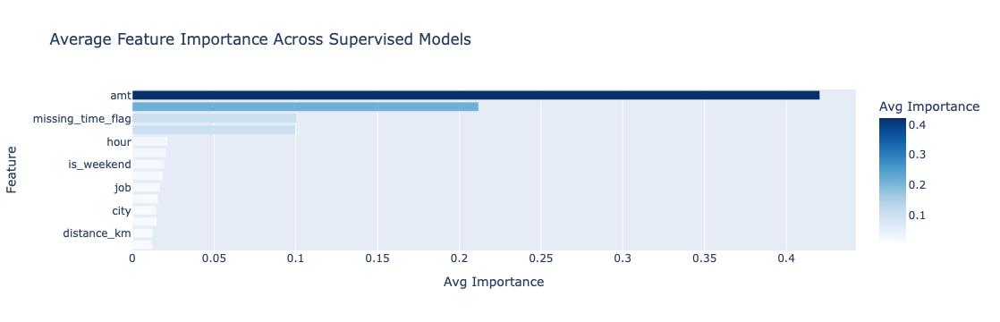

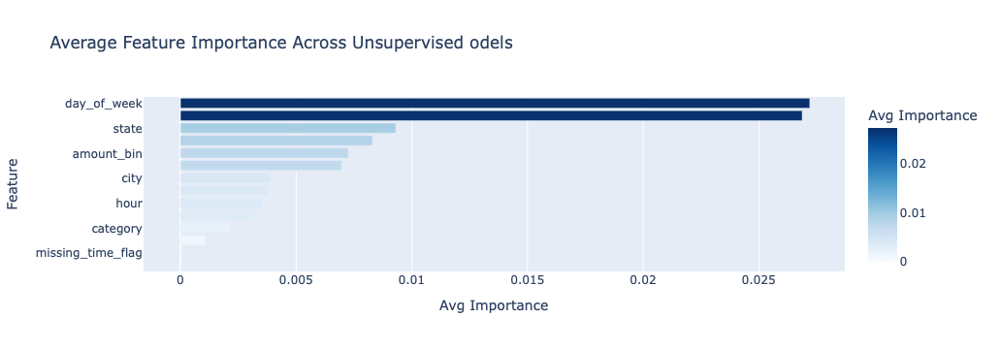

In [40]:
# Plot for Supervised learning model 
fig_supervised = px.bar(
    merged_features,
    x='Avg Importance',
    y='Feature',
    orientation='h',
    title='Average Feature Importance Across Supervised Models',
    color='Avg Importance',
    color_continuous_scale='Blues'
)

fig_supervised.update_layout(yaxis=dict(autorange='reversed'))
fig_supervised.show()

# Plot for Unsupervised learning model 
fig_unsuper = px.bar(
    merged_unsup,
    x='Avg Importance',
    y='Feature',
    orientation='h',
    title='Average Feature Importance Across Unsupervised odels',
    color='Avg Importance',
    color_continuous_scale='Blues'
)

fig_unsuper.update_layout(yaxis=dict(autorange='reversed'))
fig_unsuper.show()

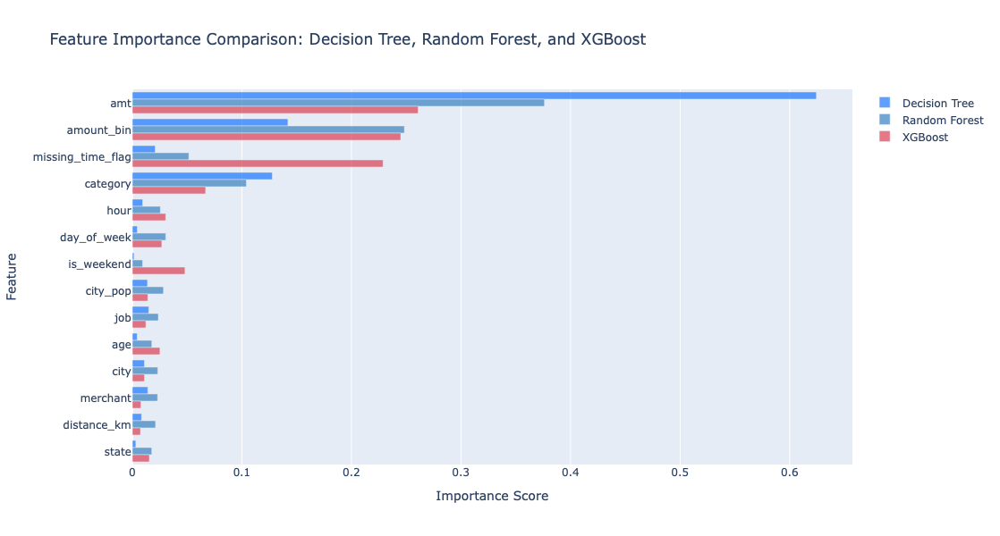

In [41]:
# Comparison between supervised models 
top_features = merged_features.copy().sort_values(by='Avg Importance', ascending=False)

# Create a figure
fig = go.Figure()

# Decision Tree
fig.add_trace(go.Bar(
    x=top_features['DT Importance'],
    y=top_features['Feature'],
    name='Decision Tree',
    orientation='h',
    marker=dict(color='rgba(26, 118, 255, 0.7)')
))

# Random Forest
fig.add_trace(go.Bar(
    x=top_features['RF Importance'],
    y=top_features['Feature'],
    name='Random Forest',
    orientation='h',
    marker=dict(color='rgba(55, 128, 191, 0.7)')
))

# XGBoost
fig.add_trace(go.Bar(
    x=top_features['XGB Importance'],
    y=top_features['Feature'],
    name='XGBoost',
    orientation='h',
    marker=dict(color='rgba(219, 64, 82, 0.7)')
))

# Update layout
fig.update_layout(
    title='Feature Importance Comparison: Decision Tree, Random Forest, and XGBoost',
    xaxis_title='Importance Score',
    yaxis_title='Feature',
    barmode='group',
    yaxis=dict(autorange='reversed'),
    height=600,
    width=1000
)

fig.show()

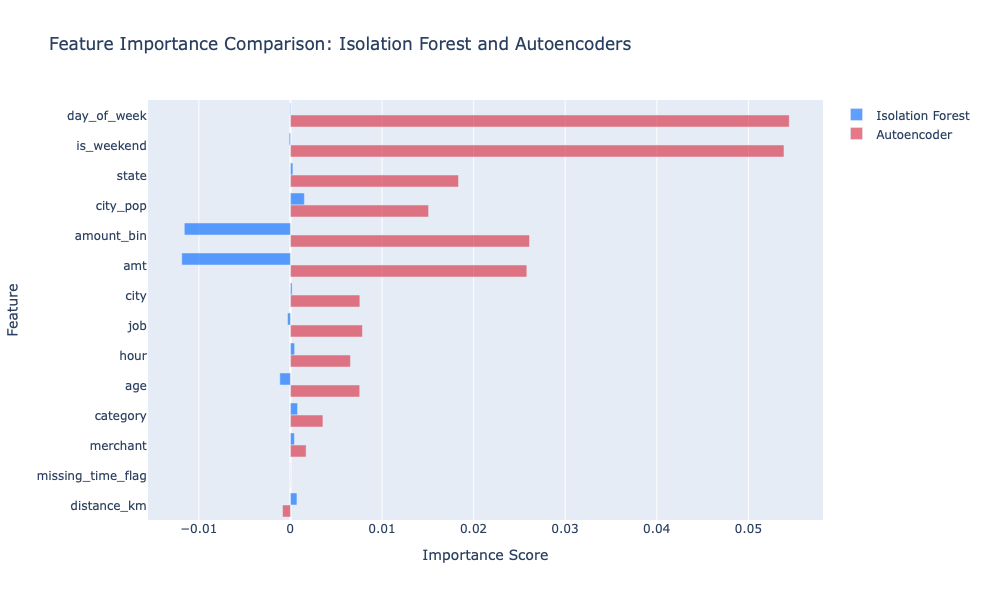

In [42]:
# Comparison between unsupervised models 
top_unsuper_features = merged_unsup.copy().sort_values(by='Avg Importance', ascending=False)

# Create a figure
fig = go.Figure()

# Isolation Forest
fig.add_trace(go.Bar(
    x=top_unsuper_features['ISO Importance'],
    y=top_unsuper_features['Feature'],
    name='Isolation Forest',
    orientation='h',
    marker=dict(color='rgba(26, 118, 255, 0.7)')
))

# Auto Encoder
fig.add_trace(go.Bar(
    x=top_unsuper_features['Autoencoder Importance'],
    y=top_unsuper_features['Feature'],
    name='Autoencoder',
    orientation='h',
    marker=dict(color='rgba(219, 64, 82, 0.7)')
))

# Update layout
fig.update_layout(
    title='Feature Importance Comparison: Isolation Forest and Autoencoders',
    xaxis_title='Importance Score',
    yaxis_title='Feature',
    barmode='group',
    yaxis=dict(autorange='reversed'),
    height=600,
    width=1000
)

fig.show()

<b> Team Analysis <b/>:
- Supervised model: 
- Unsupervised model:

#### **3.5 Risk Scoring Model**

<b> Purpose <b/> :

To assign a fraud probability score to each transaction, representing the likelihood of fraudulent behavior based on supervised learning predictions and high risk features. 

<b> Method<b/> :

- <i> Model Based </i> :
Obtain fraud probability scores (ranging from 0 to 1) from two supervised learning models — Random Forest and XGBoost that both trained on SMOTE-balanced labeled training data. The models are then applied to real, non-resampled data to predict the likelihood of fraud for each transaction.

-  <i> Rule Based  </i>:
Incorporate selected high-risk features identified in our EDA process (e.g., amount, merchant category, transaction time (hour), missing timestamps, distance and age) into a behavioral scoring component.



#### 3.5.1 Model Based

#### 3.5.1.1 Initial Result

In [43]:
# Recall: we use the X dataset with all the prediction features (exclude the 'is_fraud' as our target variable)
X.head()

,amt,distance_km,city,state,city_pop,hour,day_of_week,is_weekend,missing_time_flag,age,job,category,merchant,amount_bin
0,14.37,109.285552,166,0,145,0.0,0.0,0,0,86,1,3,179,0
1,966.11,79.856896,166,0,145,15.0,0.0,0,0,86,1,11,564,4
2,49.61,66.807915,166,0,145,22.0,0.0,0,0,86,1,9,682,0
3,295.26,39.636227,166,0,145,23.0,0.0,0,0,86,1,4,537,3
4,18.17,77.611529,166,0,145,23.0,0.0,0,0,86,1,5,352,0


In [44]:
# Step 1: Apply imputer and scaling method to X variables in handling the missing values and varies scale measurement
X_model_imputed = pd.DataFrame(imputer.transform(X), columns=X.columns)
X_model_scaled = pd.DataFrame(scaler.transform(X), columns=X.columns)

# Step 2: Generate the risk score from each model
df_cleaned['rf_fraud_risk_score'] = rf_model.predict_proba(X_model_scaled)[:, 1]
df_cleaned['xgb_fraud_risk_score'] = xgb_model.predict_proba(X_model_scaled)[:, 1]

# Step 3: Define the risk category level 
def categorize_risk(score):
    if score > 0.9:
        return 'High'
    elif score > 0.6:
        return 'Medium'
    else:
        return 'Low'

df_cleaned['xgb_risk_level'] = df_cleaned['xgb_fraud_risk_score'].apply(categorize_risk)
df_cleaned['rf_risk_level'] = df_cleaned['rf_fraud_risk_score'].apply(categorize_risk)

# Step 4: Generate the summary for each model
risk_levels = df_cleaned[['xgb_risk_level', 'rf_risk_level']].copy()
risk_levels = risk_levels.melt(var_name='Model', value_name='Risk Level')
risk_levels['Model'] = risk_levels['Model'].map({
    'xgb_risk_level': 'XGBoost',
    'rf_risk_level': 'Random Forest'
})

risk_summary = risk_levels.groupby(['Model', 'Risk Level']).size().reset_index(name='Count')
risk_summary

,Model,Risk Level,Count
0,Random Forest,High,3272
1,Random Forest,Low,2232
2,Random Forest,Medium,8942
3,XGBoost,High,13578
4,XGBoost,Low,345
5,XGBoost,Medium,523


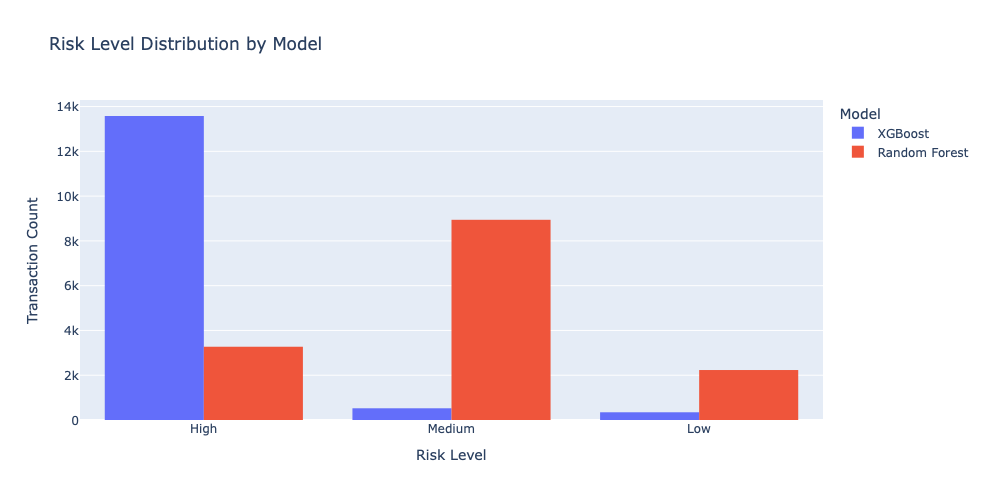

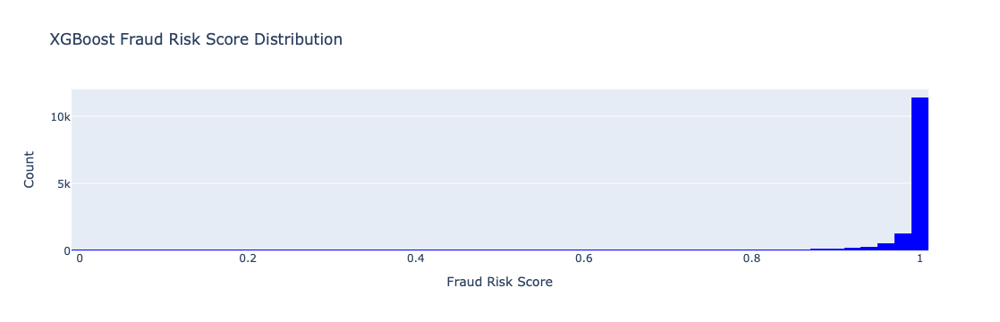

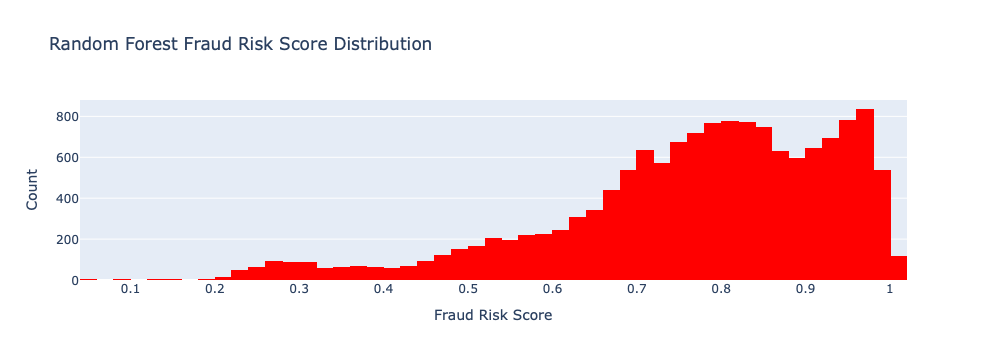

In [45]:
# Step 5: Visualise the distribution of fraud risk level each model
fig_risk_level = px.histogram(
    risk_levels,
    x="Risk Level",
    color="Model",
    category_orders={"Fraud Risk Level": ["Low", "Medium", "High"]},
    barmode="group",
    title="Risk Level Distribution by Model"
)
fig_risk_level.update_layout(xaxis_title="Risk Level", 
                  yaxis_title="Transaction Count",
                 width=800,
                 height=500)

fig_risk_level.show()

# Step 6: Visualise the distribution of fraud risk score each model
fig = px.histogram(
    df_cleaned, 
    x="xgb_fraud_risk_score", 
    nbins=50, 
    title="XGBoost Fraud Risk Score Distribution"
)
fig.update_traces(marker_color='blue')
fig.update_layout(xaxis_title="Fraud Risk Score", yaxis_title="Count")
fig.show()

fig = px.histogram(
    df_cleaned, 
    x="rf_fraud_risk_score", 
    nbins=50, 
    title="Random Forest Fraud Risk Score Distribution"
)
fig.update_traces(marker_color='red')
fig.update_layout(xaxis_title="Fraud Risk Score", yaxis_title="Count")
fig.show()

#### 3.5.1.2 Misalignment Result Analysis

In [46]:
df_cleaned[['is_fraud','xgb_fraud_risk_score','rf_fraud_risk_score']]

,is_fraud,xgb_fraud_risk_score,rf_fraud_risk_score
0,1,0.999802,0.90
1,1,0.919799,0.52
2,1,0.999936,0.92
3,1,0.999957,0.93
4,1,0.999993,0.91
...,...,...,...
14441,0,0.762603,0.30
14442,0,0.998123,0.76
14443,0,0.998979,0.73
14444,0,0.047159,0.50


In [47]:
# Non-fraud cases with very high predicted score
false_positives_xgb = df_cleaned[(df_cleaned['is_fraud'] == 0) & (df_cleaned['xgb_fraud_risk_score'] > 0.9)]
false_positives_rf = df_cleaned[(df_cleaned['is_fraud'] == 0) & (df_cleaned['rf_fraud_risk_score'] > 0.9)]

# Count how many of these are being predicted incorrectly
display(false_positives_xgb[['xgb_fraud_risk_score', 'rf_fraud_risk_score', 'is_fraud']].head())
print(f"False Positives (XGB > 0.9, but is_fraud == 0): {len(false_positives_xgb)}")

display(false_positives_rf[['xgb_fraud_risk_score', 'rf_fraud_risk_score', 'is_fraud']].head())
print(f"False Positives (RF > 0.9, but is_Fraud == 0): {len(false_positives_rf)}")

,xgb_fraud_risk_score,rf_fraud_risk_score,is_fraud
1782,0.972581,0.24,0
1783,0.998009,0.62,0
1784,0.999521,0.85,0
1785,0.937409,0.69,0
1786,0.999643,0.72,0


False Positives (XGB > 0.9, but is_fraud == 0): 11897


,xgb_fraud_risk_score,rf_fraud_risk_score,is_fraud
2019,0.999974,0.97,0
2028,0.999869,0.91,0
2031,0.999702,0.98,0
2038,0.998306,0.93,0
2040,0.997019,0.97,0


False Positives (RF > 0.9, but is_Fraud == 0): 2660


<b> Team Analysis </b>:
- From the summary table above on the predicted fraud risk score, we see that there is major issue which models have assigned high fraud probability score (e.g., 0.99) for transactions that are actually labeled as 0 or non-fraud, indicating a false positives alarms in the model result. This problem could happen due to:

- <b> <i> Heavy class imbalance  </b> </i>: the data is suffered from heavy imbalanced set (e.g., fraud class only represents 12% of the total dataset) given in the real-world scenaro that fraud is rare event. Therefore, the model may overfit to certain patterns that are actually present in a few legitimate transactions due to imbalanced learning.
- <b> <i> Lack of model calibration </b> </i>: Model such as Random Forest and XGBoost does not guarantee to produce a well-calibrated probabilities, potentially assign overconfident score when trees built are deep. Thus, the prediction could not be trusted in absolute way

In [48]:
# Step 1: Recalculate the risk score probability using balanced dataset (using validation data set test first)
rf_risk_score_val_balanced = rf_model.predict_proba(X_val_scaled)[:, 1]
xgb_risk_score_val_balanced  = xgb_model.predict_proba(X_val_scaled)[:, 1]

rf_risk_level_val_balanced  = pd.Series(rf_risk_score_val_balanced).apply(categorize_risk)
xgb_risk_level_val_balanced = pd.Series(xgb_risk_score_val_balanced).apply(categorize_risk)

# Step 2: Build dataFrame for risk score and level predictions with corresponding true labels
risk_model_val_df = pd.DataFrame({
    'rf_fraud_risk_score': rf_risk_score_val_balanced,
    'rf_risk_level': rf_risk_level_val_balanced,
    'xgb_fraud_risk_score': xgb_risk_score_val_balanced,
    'xgb_risk_level': xgb_risk_level_val_balanced,
    'is_fraud': Y_val.reset_index(drop=True)
})


# Step 3: Calculate the false positives on new predicted score
## Non-fraud cases with very high predicted score
false_positives_rf_val = risk_model_val_df[(
    risk_model_val_df['is_fraud'] == 0) & (risk_model_val_df['rf_fraud_risk_score'] > 0.9)]

false_positives_xgb_val = risk_model_val_df[(
    risk_model_val_df['is_fraud'] == 0) & (risk_model_val_df['xgb_fraud_risk_score'] > 0.9)]

## Count how many of these are being predicted incorrectly
print("==== Validation Set Risk Model Performance ====")
display(false_positives_rf_val[['rf_fraud_risk_score', 'xgb_fraud_risk_score', 'is_fraud']].head())
print(f"False Positives (RF > 0.9, but is_Fraud == 0): {len(false_positives_rf_val)}")

display(false_positives_xgb_val[['rf_fraud_risk_score', 'xgb_fraud_risk_score', 'is_fraud']].head())
print(f"False Positives (XGB > 0.9, but is_fraud == 0): {len(false_positives_xgb_val)}")

==== Validation Set Risk Model Performance ====


,rf_fraud_risk_score,xgb_fraud_risk_score,is_fraud
422,0.91,0.908079,0
471,0.92,0.961016,0
749,0.92,0.997405,0
819,0.99,0.999241,0
1495,0.97,0.961136,0


False Positives (RF > 0.9, but is_Fraud == 0): 8


,rf_fraud_risk_score,xgb_fraud_risk_score,is_fraud
422,0.91,0.908079,0
471,0.92,0.961016,0
749,0.92,0.997405,0
819,0.99,0.999241,0
996,0.90,0.990911,0


False Positives (XGB > 0.9, but is_fraud == 0): 10


In [49]:
# Step 4: Calculate risk score probability using test set 
rf_risk_score_test_balanced = rf_model.predict_proba(X_test_scaled)[:, 1]
xgb_risk_score_test_balanced  = xgb_model.predict_proba(X_test_scaled)[:, 1]

rf_risk_level_test_balanced  = pd.Series(rf_risk_score_test_balanced).apply(categorize_risk)
xgb_risk_level_test_balanced = pd.Series(xgb_risk_score_test_balanced).apply(categorize_risk)

# Step 5: Build dataFrame for risk score and level predictions with corresponding true labels
risk_model_test_df = pd.DataFrame({
    'rf_fraud_risk_score': rf_risk_score_test_balanced,
    'rf_risk_level': rf_risk_level_test_balanced,
    'xgb_fraud_risk_score': xgb_risk_score_test_balanced,
    'xgb_risk_level': xgb_risk_level_test_balanced,
    'is_fraud': Y_test.reset_index(drop=True)
})

# Step 3: Calculate the false positives on new predicted score
## Non-fraud cases with very high predicted score
false_positives_rf_test = risk_model_test_df[(
    risk_model_test_df['is_fraud'] == 0) & (risk_model_test_df['rf_fraud_risk_score'] > 0.9)]

false_positives_xgb_test = risk_model_test_df[(
    risk_model_test_df['is_fraud'] == 0) & (risk_model_test_df['xgb_fraud_risk_score'] > 0.9)]

## Count how many of these are being predicted incorrectly
print("==== Test Set Risk Model Performance ====")
display(false_positives_rf_test[['rf_fraud_risk_score', 'xgb_fraud_risk_score', 'is_fraud']].head())
print(f"False Positives (RF > 0.9, but is_Fraud == 0): {len(false_positives_rf_test)}")

display(false_positives_xgb_test[['rf_fraud_risk_score', 'xgb_fraud_risk_score', 'is_fraud']].head())
print(f"False Positives (XGB > 0.9, but is_fraud == 0): {len(false_positives_xgb_test)}")

==== Test Set Risk Model Performance ====


,rf_fraud_risk_score,xgb_fraud_risk_score,is_fraud
678,0.99,0.999416,0
838,0.97,0.992667,0
1002,0.99,0.998829,0
1618,0.96,0.957844,0
1659,0.99,0.999074,0


False Positives (RF > 0.9, but is_Fraud == 0): 7


,rf_fraud_risk_score,xgb_fraud_risk_score,is_fraud
121,0.85,0.987875,0
557,0.44,0.954852,0
678,0.99,0.999416,0
838,0.97,0.992667,0
1002,0.99,0.998829,0


False Positives (XGB > 0.9, but is_fraud == 0): 10


<b> Team Analysis </b>:
- After applying SMOTE for data resampling, the number of misidentified transactions (False Positives) has been significantly reduced to only 8 transactions on the validation set. Both Random Forest and XGBoost models produced similar results.
- On the test set, both models demonstrate strong predictive performance, maintaining a low number of False Positives — 7 for Random Forest and 10 for XGBoost.
- These results indicate that both models are reliable for predicting the default (fraud) probability, and can be confidently used in the risk scoring system.

#### 3.5.1.3 Transactions Profile Analysis

<b> Purpose </b> : 
- To find the characteristics of transactions that have predicted high fraud risk probability, hence providing insightful information for financial institutions as part of risk management framework
- Analysis is performed on the combination of validation and test dataset to reflect the realistic predictions and potential fraud cases for unseen pattern 

In [50]:
# Step 1: Combine validation and test risk prediction result into one dataframe
X_val_scaled_df = X_val_scaled.reset_index(drop=True)
X_test_scaled_df = X_test_scaled.reset_index(drop=True)

risk_model_val_df = pd.concat([X_val_scaled_df, risk_model_val_df], axis=1)
risk_model_test_df = pd.concat([X_test_scaled_df, risk_model_test_df], axis=1)

risk_model_val_df['dataset'] = 'validation'
risk_model_test_df['dataset'] = 'test'

risk_model_df = pd.concat([risk_model_val_df, risk_model_test_df], ignore_index=True)
risk_model_df

,amt,distance_km,city,state,city_pop,hour,day_of_week,is_weekend,missing_time_flag,age,job,category,merchant,amount_bin,rf_fraud_risk_score,rf_risk_level,xgb_fraud_risk_score,xgb_risk_level,is_fraud,dataset
0,-0.794260,-1.187909,0.270783,1.174058,-0.344497,0.051228,0.042346,-0.314510,0.759647,-0.008109,0.644310,1.424346,0.678791,-1.036258,0.00,Low,0.000293,Low,0,validation
1,-0.776667,0.600830,1.367103,0.288592,-0.370992,0.051228,0.042346,-0.314510,0.759647,-1.512299,0.466535,0.350427,0.948138,-1.036258,0.00,Low,0.007753,Low,0,validation
2,-0.648805,1.930851,0.063930,-0.006563,-0.375207,-2.338427,-2.798010,-0.314510,-1.478188,-0.008109,1.688743,-1.260452,-0.826386,-0.450700,0.02,Low,0.000372,Low,0,validation
3,-0.748675,-1.008109,0.560376,1.469213,-0.376436,0.051228,0.042346,-0.314510,0.759647,-0.008109,1.466523,-0.186532,-0.076438,-1.036258,0.09,Low,0.004932,Low,0,validation
4,-0.727513,-0.243128,1.325732,-1.187184,-0.196750,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.711218,-0.455012,-1.444300,-1.036258,0.00,Low,0.002283,Low,0,validation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4329,-0.785143,-1.812756,1.429158,1.174058,-0.376777,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.000115,0.350427,0.699916,-1.036258,0.03,Low,0.000982,Low,0,test
4330,-0.371584,-0.095690,1.077509,-1.187184,3.743183,-2.121186,2.882702,3.670751,-1.478188,0.522781,-0.466788,1.424346,1.328393,0.134859,0.09,Low,0.000235,Low,0,test
4331,-0.787374,-0.090008,-0.639370,0.288592,-0.371138,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.600108,1.424346,-0.166221,-1.036258,0.02,Low,0.000454,Low,0,test
4332,-0.798359,1.354107,-0.639370,0.288592,-0.371138,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.600108,0.081947,-1.322830,-1.036258,0.02,Low,0.000781,Low,0,test


In [51]:
# Step 2: Find the top risky transactions based on the predicted risk level/score for each model
top = 15
top_risky_rf = risk_model_df.sort_values(by='rf_fraud_risk_score', ascending=False).head(top)
top_risky_xgb = risk_model_df.sort_values(by='xgb_fraud_risk_score', ascending=False).head(top)

print("Top Risky Transactions by Random Forest Risk Probability Score Model")
display(top_risky_rf)

print("Top Risky Transactions by XGBoost Risk Probability Score Model")
display(top_risky_xgb)

Top Risky Transactions by Random Forest Risk Probability Score Model


,amt,distance_km,city,state,city_pop,hour,day_of_week,is_weekend,missing_time_flag,age,job,category,merchant,amount_bin,rf_fraud_risk_score,rf_risk_level,xgb_fraud_risk_score,xgb_risk_level,is_fraud,dataset
2222,1.684583,0.833758,-1.301299,0.288592,-0.375051,0.051228,0.042346,-0.314510,0.759647,-0.008109,0.777642,1.155866,1.228048,1.305977,1.0,High,0.998060,High,1,test
539,1.636600,-1.602987,-1.363355,0.288592,-0.375294,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.000115,0.350427,-1.116858,1.305977,1.0,High,0.999098,High,1,validation
198,2.093290,-0.075278,0.622432,-1.187184,0.191187,0.051228,0.042346,-0.314510,0.759647,0.168854,-0.444566,1.155866,-1.005951,1.891536,1.0,High,0.999531,High,1,validation
1951,0.025831,0.285405,-0.846223,0.878903,-0.376067,0.051228,0.042346,-0.314510,0.759647,0.788226,-1.466777,-0.723492,0.831949,0.720418,1.0,High,0.999556,High,1,validation
1949,1.960716,-0.066731,1.118879,-1.187184,-0.071437,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.733440,1.155866,-1.005951,1.305977,1.0,High,0.999786,High,1,validation
1505,0.072142,-0.015640,-1.570208,-1.187184,-0.371205,0.051228,0.042346,-0.314510,0.759647,-0.008109,-0.489010,-0.723492,0.525632,0.720418,1.0,High,0.999550,High,1,validation
2971,1.913709,-0.280936,-0.370461,-1.777494,-0.376137,0.051228,0.042346,-0.314510,0.759647,-2.751043,-0.555676,1.155866,-0.266566,1.305977,1.0,High,0.999125,High,1,test
2904,1.514676,1.176571,1.594641,-1.777494,-0.376449,1.789159,-0.904440,-0.314510,-1.478188,2.292416,-1.800106,1.424346,-1.782305,1.305977,1.0,High,0.999279,High,1,test
3986,2.169071,0.846111,0.849970,0.288592,-0.369622,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.044559,1.155866,0.620696,1.891536,1.0,High,0.997706,High,1,test
1067,0.092411,0.730200,0.849970,0.288592,-0.369622,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.044559,-0.723492,0.525632,0.720418,1.0,High,0.999768,High,1,validation


Top Risky Transactions by XGBoost Risk Probability Score Model


,amt,distance_km,city,state,city_pop,hour,day_of_week,is_weekend,missing_time_flag,age,job,category,merchant,amount_bin,rf_fraud_risk_score,rf_risk_level,xgb_fraud_risk_score,xgb_risk_level,is_fraud,dataset
2825,0.054744,-1.015022,1.594641,-1.777494,-0.376449,1.789159,-0.904440,-0.314510,-1.478188,2.292416,-1.800106,-0.723492,-1.211922,0.720418,1.00,High,0.999957,High,1,test
3110,1.857362,1.229918,1.284361,0.288592,-0.376459,2.006400,1.935916,3.670751,-1.478188,-0.008109,-0.400122,1.155866,-0.942575,1.305977,1.00,High,0.999954,High,1,test
3484,1.463598,-1.880670,1.470529,-0.006563,-0.364301,2.006400,-0.904440,-0.314510,-1.478188,-0.008109,-1.355667,0.350427,-1.291142,1.305977,1.00,High,0.999952,High,1,test
1504,0.035729,0.427963,-0.597999,0.288592,-0.376528,0.051228,0.042346,-0.314510,0.759647,-2.751043,1.422079,-0.723492,0.694634,0.720418,1.00,High,0.999931,High,1,validation
1327,0.155896,-1.065976,-0.142923,-1.187184,-0.339571,-2.555669,0.042346,-0.314510,-1.478188,-0.008109,1.088750,-0.723492,0.520351,0.720418,0.94,High,0.999929,High,1,validation
3405,1.776284,1.096804,-0.618685,0.288592,-0.373402,1.789159,1.935916,3.670751,-1.478188,3.265715,1.288748,1.155866,-1.592177,1.305977,0.97,High,0.999929,High,1,test
1426,1.749378,1.100431,1.036138,-1.187184,2.137328,2.006400,-0.904440,-0.314510,-1.478188,-0.008109,0.666532,1.155866,0.129533,1.305977,0.99,High,0.999927,High,1,validation
4232,0.078331,-0.447777,-1.652949,-0.892029,0.914986,0.051228,0.042346,-0.314510,0.759647,2.380898,0.399869,-0.723492,0.525632,0.720418,0.99,High,0.999925,High,1,test
1548,1.808430,0.042919,1.222306,0.878903,-0.376210,1.789159,-2.798010,-0.314510,-1.478188,3.265715,1.355413,1.155866,-0.810542,1.305977,0.83,Medium,0.999923,High,1,validation
2014,1.583514,-0.666921,1.139564,0.878903,-0.372775,0.051228,0.042346,-0.314510,0.759647,2.469379,-1.444555,0.350427,-1.291142,1.305977,0.98,High,0.999912,High,1,validation


#### 3.5.1.4 Confusion Matrix Analysis for Model-Based Risk Score Model

#### Random Forest Model

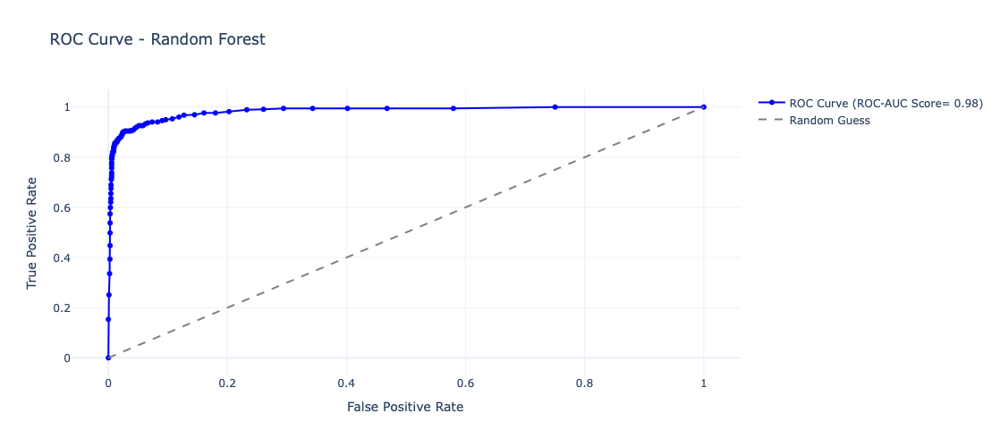

In [52]:
# Step 1: Calculate and plot the ROC metrics
rf_y_true = risk_model_df['is_fraud']
rf_y_risk_score = risk_model_df['rf_fraud_risk_score']

rf_fpr, rf_tpr, rf_thresholds = roc_curve(rf_y_true, rf_y_risk_score)
rf_auc_score = roc_auc_score(rf_y_true, rf_y_risk_score)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=rf_fpr, y=rf_tpr,
    mode='lines+markers',
    name=f'ROC Curve (ROC-AUC Score= {rf_auc_score:.2f})',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    name='Random Guess',
    line=dict(dash='dash', color='gray')
))

# plot
fig.update_layout(
    title='ROC Curve - Random Forest',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    width=700,
    height=500,
    template='plotly_white'
)

fig.show()

In [53]:
risk_model_df

,amt,distance_km,city,state,city_pop,hour,day_of_week,is_weekend,missing_time_flag,age,job,category,merchant,amount_bin,rf_fraud_risk_score,rf_risk_level,xgb_fraud_risk_score,xgb_risk_level,is_fraud,dataset
0,-0.794260,-1.187909,0.270783,1.174058,-0.344497,0.051228,0.042346,-0.314510,0.759647,-0.008109,0.644310,1.424346,0.678791,-1.036258,0.00,Low,0.000293,Low,0,validation
1,-0.776667,0.600830,1.367103,0.288592,-0.370992,0.051228,0.042346,-0.314510,0.759647,-1.512299,0.466535,0.350427,0.948138,-1.036258,0.00,Low,0.007753,Low,0,validation
2,-0.648805,1.930851,0.063930,-0.006563,-0.375207,-2.338427,-2.798010,-0.314510,-1.478188,-0.008109,1.688743,-1.260452,-0.826386,-0.450700,0.02,Low,0.000372,Low,0,validation
3,-0.748675,-1.008109,0.560376,1.469213,-0.376436,0.051228,0.042346,-0.314510,0.759647,-0.008109,1.466523,-0.186532,-0.076438,-1.036258,0.09,Low,0.004932,Low,0,validation
4,-0.727513,-0.243128,1.325732,-1.187184,-0.196750,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.711218,-0.455012,-1.444300,-1.036258,0.00,Low,0.002283,Low,0,validation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4329,-0.785143,-1.812756,1.429158,1.174058,-0.376777,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.000115,0.350427,0.699916,-1.036258,0.03,Low,0.000982,Low,0,test
4330,-0.371584,-0.095690,1.077509,-1.187184,3.743183,-2.121186,2.882702,3.670751,-1.478188,0.522781,-0.466788,1.424346,1.328393,0.134859,0.09,Low,0.000235,Low,0,test
4331,-0.787374,-0.090008,-0.639370,0.288592,-0.371138,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.600108,1.424346,-0.166221,-1.036258,0.02,Low,0.000454,Low,0,test
4332,-0.798359,1.354107,-0.639370,0.288592,-0.371138,0.051228,0.042346,-0.314510,0.759647,-0.008109,-1.600108,0.081947,-1.322830,-1.036258,0.02,Low,0.000781,Low,0,test


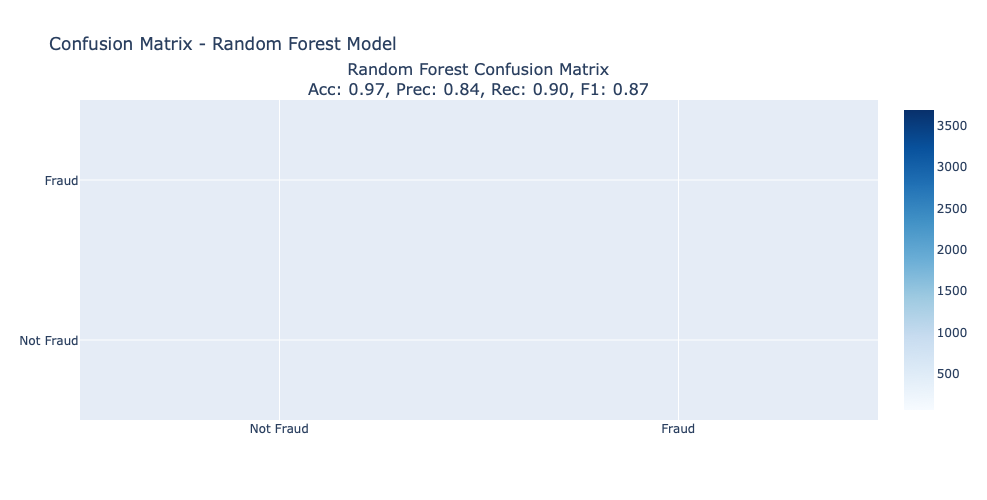

In [54]:
# Step 2: Choose the optimal threshold (max the TPR - FPR)
rf_optimal_idx = (rf_tpr - rf_fpr).argmax()
rf_optimal_thres = rf_thresholds[rf_optimal_idx]

## Convert risk scores to class predictions
y_true = risk_model_df['is_fraud']
rf_y_pred = (risk_model_df['rf_fraud_risk_score'] >= rf_optimal_thres).astype(int)

# Step 3: Evaluate the model performance
## Compute the metrics
cm_rf_risk = confusion_matrix(y_true, rf_y_pred)
acc_rf_risk = accuracy_score(y_true, rf_y_pred)
prec_rf_risk = precision_score(y_true, rf_y_pred, zero_division=0)
rec_rf_risk = recall_score(y_true, rf_y_pred, zero_division=0)
f1_rf_risk = f1_score(y_true, rf_y_pred, zero_division=0)

labels = ['Not Fraud', 'Fraud']

## Plot the confusion matrix
fig = make_subplots(
    rows=1, cols=1,
    subplot_titles=[f"Random Forest Confusion Matrix<br>Acc: {acc_rf_risk:.2f}, Prec: {prec_rf_risk:.2f}, Rec: {rec_rf_risk:.2f}, F1: {f1_rf_risk:.2f}"]
)

fig.add_trace(go.Heatmap(
    z=cm_rf_risk,
    x=labels,
    y=labels,
    colorscale='Blues',
    showscale=True,
    hovertemplate='Predicted: %{x}<br>Actual: %{y}<br>Count: %{z}<extra></extra>'
), row=1, col=1)

fig.update_layout(
    title_text="Confusion Matrix - Random Forest Model",
    width=600,
    height=500
)

fig.show()

#### XGBoost Model

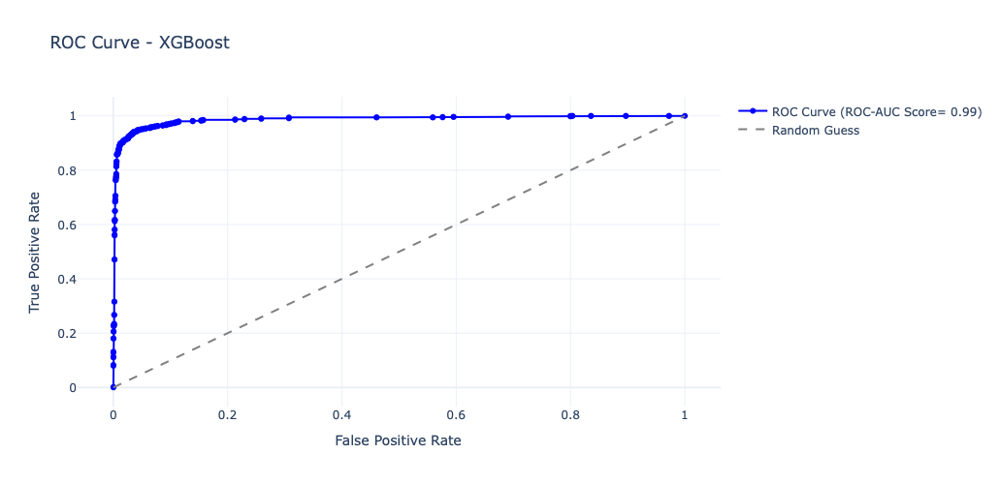

In [55]:
# Step 1: Calculate and plot the ROC metrics
xgb_y_true = risk_model_df['is_fraud']
xgb_y_risk_score = risk_model_df['xgb_fraud_risk_score']

xgb_fpr, xgb_tpr, xgb_thresholds = roc_curve(xgb_y_true, xgb_y_risk_score)
xgb_auc_score = roc_auc_score(xgb_y_true, xgb_y_risk_score)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=xgb_fpr, y=xgb_tpr,
    mode='lines+markers',
    name=f'ROC Curve (ROC-AUC Score= {xgb_auc_score:.2f})',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    name='Random Guess',
    line=dict(dash='dash', color='gray')
))

# plot
fig.update_layout(
    title='ROC Curve - XGBoost',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    width=700,
    height=500,
    template='plotly_white'
)

fig.show()

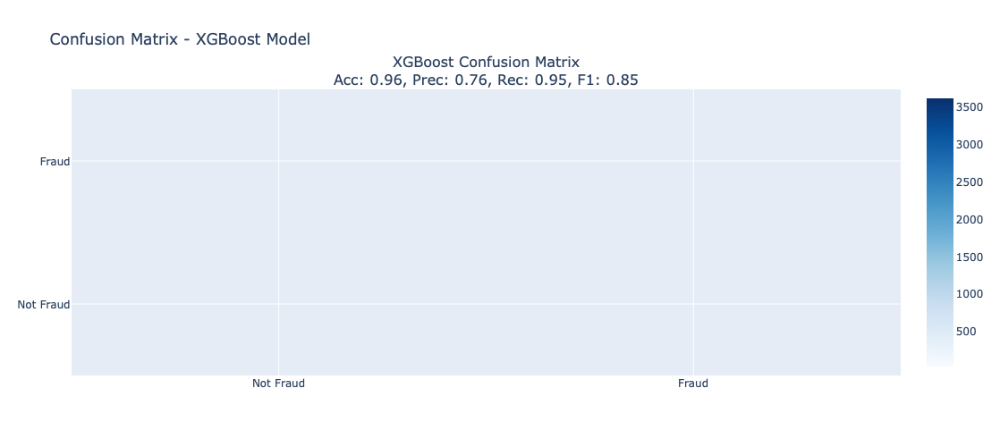

In [56]:
# Step 2: Choose the optimal threshold (max the TPR - FPR)
xgb_optimal_idx = (xgb_tpr - xgb_fpr).argmax()
xgb_optimal_thres = xgb_thresholds[xgb_optimal_idx]

## Convert risk scores to class predictions
y_true = risk_model_df['is_fraud']
xgb_y_pred = (risk_model_df['xgb_fraud_risk_score'] >= xgb_optimal_thres).astype(int)

# Step 3: Evaluate the model performance
## Compute the metrics
cm_xgb_risk = confusion_matrix(y_true, xgb_y_pred)
acc_xgb_risk = accuracy_score(y_true, xgb_y_pred)
prec_xgb_risk = precision_score(y_true, xgb_y_pred, zero_division=0)
rec_xgb_risk = recall_score(y_true, xgb_y_pred, zero_division=0)
f1_xgb_risk = f1_score(y_true, xgb_y_pred, zero_division=0)

labels = ['Not Fraud', 'Fraud']

## Plot the confusion matrix
fig = make_subplots(
    rows=1, cols=1,
    subplot_titles=[f"XGBoost Confusion Matrix<br>Acc: {acc_xgb_risk:.2f}, Prec: {prec_xgb_risk:.2f}, Rec: {rec_xgb_risk:.2f}, F1: {f1_xgb_risk:.2f}"]
)

fig.add_trace(go.Heatmap(
    z=cm_xgb_risk,
    x=labels,
    y=labels,
    colorscale='Blues',
    showscale=True,
    hovertemplate='Predicted: %{x}<br>Actual: %{y}<br>Count: %{z}<extra></extra>'
), row=1, col=1)

fig.update_layout(
    title_text="Confusion Matrix - XGBoost Model",
    width=600,
    height=500
)

fig.show()

#### 3.5.2 Rule Based

Our rule-based strategy is to assign up to 10 points based on six risk factors from EDA analysis with final score is capped at 10, using features below:

**Amount (amt)**: High risk component given the likelihood of fraud losses will increase along with higher transaction amounts - 4~6 points.

**Merchant Category**: High risk  — Categories like shopping_net, misc_net - 3 points.

**Transaction Time (hour)**: Medium risk — Late night or early morning transactions - 2~3 points.

**Missing Timestamp**: Medium risk as it indicates potential data irregularity - 1 point.

**Distance (distance_km)**: Low risk — Large geographical distance - 1 point.

**Credit Holder Age**: Low risk  — Very young or older users may be more vulnerable - 1 point.


In [57]:
# Step 1: Define function for risk scoring rule

def risk_score_components(row):
    scores = {'amount_score': 0, 
              'merchant_category_score': 0, 
              'hour_score': 0, 
              'missing_time_score': 0, 
              'distance_score': 0, 
              'age_score': 0}

    # Risk factor 1: 'transaction amount'
    if row['amt'] > 1000:
        scores['amount_score'] = 6
    elif 500 <= row['amt'] <= 1000:
        scores['amount_score'] = 5
    elif 200 <= row['amt'] < 500:
        scores['amount_score'] = 4

    # Risk factor 2: 'merchant category'
    high_risk_categories = ['shopping_net', 'misc_net', 'grocery_pos']
    if row['category'] in high_risk_categories:
        scores['merchant_category_score_score'] = 3

    # Risk factor 3: 'transaction time'
    if row['hour'] in [0, 1, 2, 3]:
        scores['hour_score'] = 3
    elif row['hour'] in [22, 23]:
        scores['hour_score'] = 2

    # Risk factor 3: 'missing transaction time'
    if row['missing_time_flag'] == 1:
        scores['missing_time_score'] = 1

    # Risk factor 4: 'merchant distance'
    if row['distance_km'] > 100:
        scores['distance_score'] = 1

    # Risk factor 5: 'credit card holder age'
    if row['age'] < 25 or row['age'] > 65:
        scores['age_score'] = 1

    # Total score capped at 10
    total_score = min(sum(scores.values()), 10)
    
    return pd.Series({**scores, 'risk_score': total_score})

In [58]:
risk_components = df_cleaned.apply(risk_score_components, axis=1)
rule_model_df = df_cleaned.copy()

risk_rule_df = pd.concat([rule_model_df, risk_components], axis=1)
risk_rule_df

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,...,xgb_fraud_risk_score,xgb_risk_level,rf_risk_level,amount_score,merchant_category_score,hour_score,missing_time_score,distance_score,age_score,risk_score
0,2019-04-01 00:58:00,179,3,14.37,166,0,64.7556,-165.6723,145,1,...,0.999802,High,Medium,0,0,3,0,1,1,5
1,2019-04-01 15:06:00,564,11,966.11,166,0,64.7556,-165.6723,145,1,...,0.919799,High,Low,5,0,0,0,0,1,6
2,2019-04-01 22:37:00,682,9,49.61,166,0,64.7556,-165.6723,145,1,...,0.999936,High,High,0,0,2,0,0,1,3
3,2019-04-01 23:06:00,537,4,295.26,166,0,64.7556,-165.6723,145,1,...,0.999957,High,High,4,0,2,0,0,1,7
4,2019-04-01 23:59:00,352,5,18.17,166,0,64.7556,-165.6723,145,1,...,0.999993,High,High,0,0,2,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14441,NaT,411,12,122.00,8,9,45.8289,-118.4971,1302,78,...,0.762603,Medium,Low,0,0,0,1,0,0,1
14442,NaT,126,9,9.07,48,9,43.7857,-124.1437,260,16,...,0.998123,High,Medium,0,0,0,1,1,1,3
14443,NaT,549,4,104.84,2,12,44.6873,-104.4414,110,2,...,0.998979,High,Medium,0,0,0,1,0,0,1
14444,NaT,14,12,268.16,166,0,64.7556,-165.6723,145,1,...,0.047159,Low,Low,4,0,0,1,0,1,6


In [59]:
# Step 2: Define the function for risk category label based on risk score
def label_risk(score):
    if score >= 7:
        return "High Risk"
    elif score >= 4:
        return "Medium Risk"
    else:
        return "Low Risk"

risk_rule_df['rule_model_risk_level'] = risk_rule_df['risk_score'].apply(label_risk)
risk_rule_df

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,...,xgb_risk_level,rf_risk_level,amount_score,merchant_category_score,hour_score,missing_time_score,distance_score,age_score,risk_score,rule_model_risk_level
0,2019-04-01 00:58:00,179,3,14.37,166,0,64.7556,-165.6723,145,1,...,High,Medium,0,0,3,0,1,1,5,Medium Risk
1,2019-04-01 15:06:00,564,11,966.11,166,0,64.7556,-165.6723,145,1,...,High,Low,5,0,0,0,0,1,6,Medium Risk
2,2019-04-01 22:37:00,682,9,49.61,166,0,64.7556,-165.6723,145,1,...,High,High,0,0,2,0,0,1,3,Low Risk
3,2019-04-01 23:06:00,537,4,295.26,166,0,64.7556,-165.6723,145,1,...,High,High,4,0,2,0,0,1,7,High Risk
4,2019-04-01 23:59:00,352,5,18.17,166,0,64.7556,-165.6723,145,1,...,High,High,0,0,2,0,0,1,3,Low Risk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14441,NaT,411,12,122.00,8,9,45.8289,-118.4971,1302,78,...,Medium,Low,0,0,0,1,0,0,1,Low Risk
14442,NaT,126,9,9.07,48,9,43.7857,-124.1437,260,16,...,High,Medium,0,0,0,1,1,1,3,Low Risk
14443,NaT,549,4,104.84,2,12,44.6873,-104.4414,110,2,...,High,Medium,0,0,0,1,0,0,1,Low Risk
14444,NaT,14,12,268.16,166,0,64.7556,-165.6723,145,1,...,Low,Low,4,0,0,1,0,1,6,Medium Risk


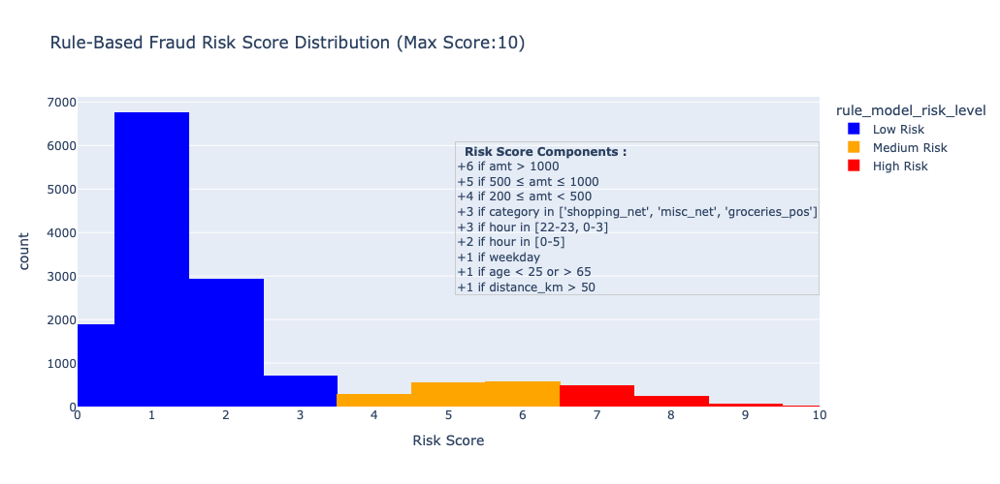

In [60]:
# Step 3: Check and visualise the class distribution for risk score

fig = px.histogram(
    risk_rule_df,
    x='risk_score',
    color='rule_model_risk_level',
    category_orders={'rule_model_risk_level': ['Low Risk', 'Medium Risk', 'High Risk']},
    title='Rule-Based Fraud Risk Score Distribution (Max Score:10)',
    labels={'risk_score': 'Risk Score', 'count': 'Transaction Count'},
    color_discrete_map={
        'Low Risk': 'blue',
        'Medium Risk': 'orange',
        'High Risk': 'red'
    }
)

max_count = risk_rule_df['risk_score'].value_counts().max() * 0.9  

fig.update_layout(
    xaxis=dict(
        dtick=1,  
        range=[0, 10],  
        title='Risk Score'
    ),

    width=800,
    height=500,
    annotations=[
        dict(
            x=10,  
            y=max_count, 
            xanchor='right',
            yanchor='top', 
            showarrow=False,
            text=(
                "<b>  Risk Score Components :</b><br>"
                "+6 if amt > 1000<br>"
                "+5 if 500 ≤ amt ≤ 1000<br>"
                "+4 if 200 ≤ amt < 500<br>"
                "+3 if category in ['shopping_net', 'misc_net', 'groceries_pos']<br>"
                "+3 if hour in [22-23, 0-3]<br>"
                "+2 if hour in [0-5]<br>"
                "+1 if weekday<br>"
                "+1 if age < 25 or > 65<br>"
                "+1 if distance_km > 50"
            ),
            font=dict(size=12),
            align='left',
            bordercolor="#ccc",
            borderwidth=1,
        )
    ]
)


fig.show()

rule_model_risk_level
Low Risk       0.849993
Medium Risk    0.096497
High Risk      0.053510
Name: proportion, dtype: float64


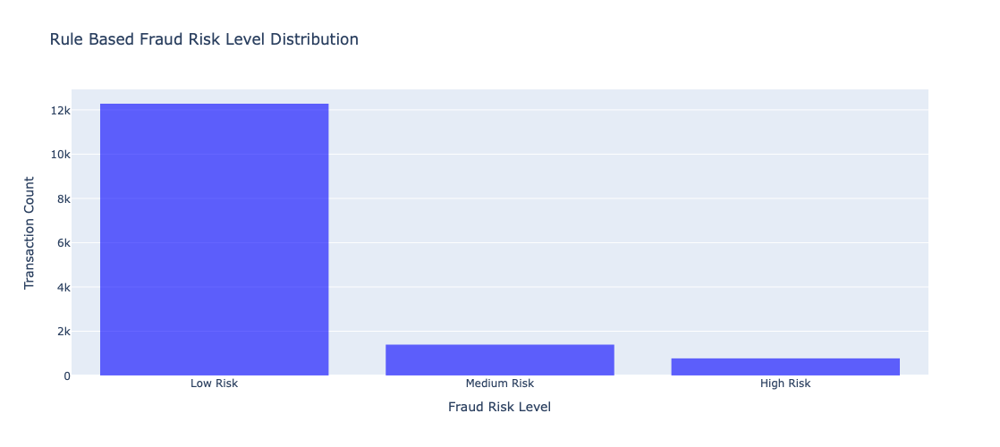

In [61]:
# Step 3: Check and visualise the class distribution for risk level
print(risk_rule_df['rule_model_risk_level'].value_counts(normalize=True))

fig = go.Figure()

# Rule score risk level
fig.add_trace(go.Histogram(
    x=risk_rule_df['rule_model_risk_level'],
    name='Rule-Based',
    opacity=0.6,
    marker=dict(color='blue')
))


fig.update_layout(
    title='Rule Based Fraud Risk Level Distribution',
    xaxis_title='Fraud Risk Level',
    yaxis_title='Transaction Count',
    xaxis=dict(categoryorder='array', categoryarray=['Low Risk', 'Medium Risk', 'High Risk']),
    barmode='overlay',
    width=800,
    height=500
)

fig.show()

#### 3.5.3 Hybrid (Random Forest & Rule-Based) Risk Score Model:

<b> Purpose </b> : 
- This hybrid approach serves as a post-model calibration or score adjustment technique, where additional domain knowledge is incorporated to slightly adjust the predictions from a trained supervised learning model (Random Forest). The adjustment is based on rule-based risk signals identified through exploratory data analysis (EDA) performed earliner (i.e., important features including transaction amount, merchant category, time of transaction, and credit card holder demographics)
- The goal is to enhance the interpretability and robustness of the fraud detection system by nudging model predictions upward in scenarios known to carry higher fraud risk, without the need to retrain the original model.

In [62]:
# Step 1: add rule based features to random forest model 
def adjust_rf_score(row):
    
    # Base model score 
    score = row['rf_fraud_risk_score'] 

    # Apply risk-enhancing rule conditions: slightly increase the score if considered high-risk
    if row['amt'] > 1000:
        score += 0.2
    if row['category'] in ['shopping_net', 'misc_net', 'grocery_pos']:
        score += 0.2
    if row['hour'] in [0, 1, 2, 3, 22, 23]:
        score += 0.1
    if row['missing_time_flag'] == 1:
        score += 0.1
    if row['age'] < 25 or row['age'] > 65:
        score += 0.05
    if row['distance_km'] > 100:
        score += 0.05

    # Total score is capped at 1 to be within range values of [0, 1]
    return min(score, 1.0)  # cap at 1

risk_rule_df['hybrid_rf_risk_score'] = risk_rule_df.apply(adjust_rf_score, axis=1)

In [63]:
# Step 2: Define the function for risk category label based on risk score
def categorize_hybrid(score):
    if score > 0.8:
        return 'High'
    elif score > 0.6:
        return 'Medium'
    else:
        return 'Low'

risk_rule_df['hybrid_rf_risk_level'] = risk_rule_df['hybrid_rf_risk_score'].apply(categorize_hybrid)

hybrid_rf_risk_level
High      0.732452
Medium    0.196525
Low       0.071023
Name: proportion, dtype: float64


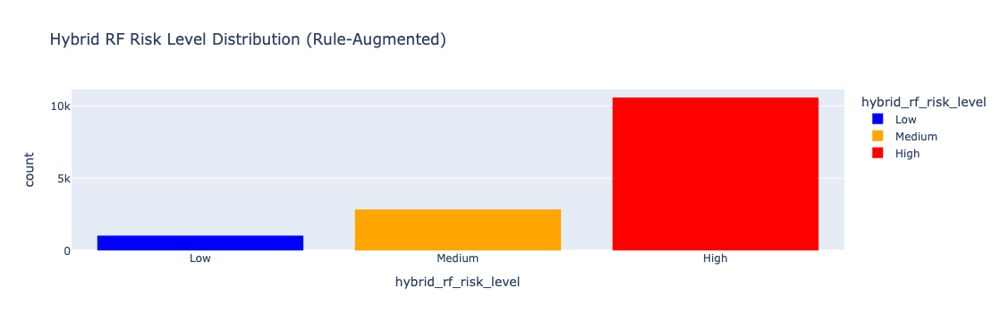

In [64]:
# Step 3: Check and visualise the class distribution for risk level
print(risk_rule_df['hybrid_rf_risk_level'].value_counts(normalize=True))

fig = px.histogram(
    risk_rule_df,
    x='hybrid_rf_risk_level',
    color='hybrid_rf_risk_level',
    category_orders={'hybrid_rf_risk_level': ['Low', 'Medium', 'High']},
    title='Hybrid RF Risk Level Distribution (Rule-Augmented)',
    color_discrete_map={
        'Low': 'blue',
        'Medium': 'orange',
        'High': 'red'
    }
)
fig.show()

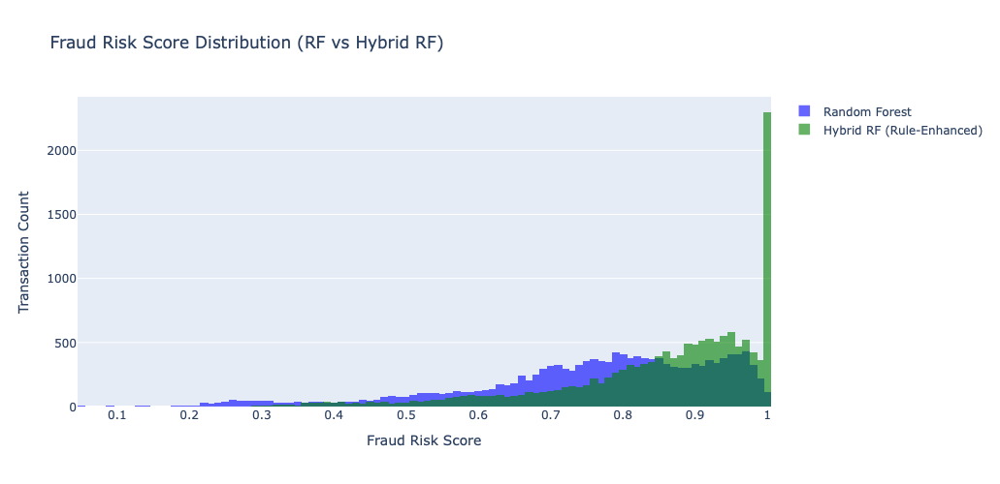

In [65]:
# Step 3: Check and visualise the class distribution for risk score
# ---------- Distribution Comparison: RF vs Hybrid RF ----------
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=risk_rule_df['rf_fraud_risk_score'],
    name='Random Forest',
    opacity=0.6,
    marker=dict(color='blue')
))

fig.add_trace(go.Histogram(
    x=risk_rule_df['hybrid_rf_risk_score'],
    name='Hybrid RF (Rule-Enhanced)',
    opacity=0.6,
    marker=dict(color='green')
))

fig.update_layout(
    title='Fraud Risk Score Distribution (RF vs Hybrid RF)',
    xaxis_title='Fraud Risk Score',
    yaxis_title='Transaction Count',
    barmode='overlay',
    width=800,
    height=500
)
fig.show()

<b> Team Analysis <b/>:
- The risk level distribution of Hybrid model shows a strong skew toward the High Risk category, with a proportion of 73.24% of transactions classified as high risk, while the Random Forest model distribution is more evenly spread across lower scores and a gradual increase toward higher scores. This suggests that the Hybrid model might amplify Random Forest's risk scores with rule based augmented and aggressively flag transactions, thus pushing transactions into higher risk range.

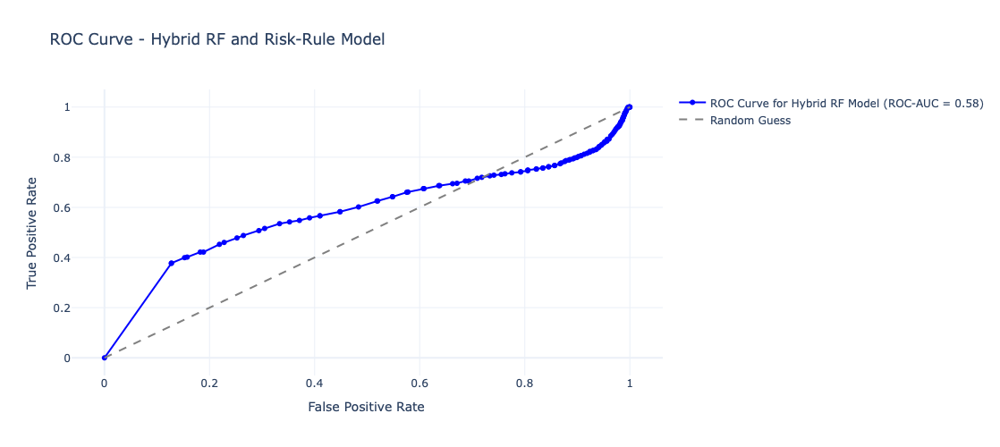

In [66]:
# Step 3: Check and visualise the ROC curve
# Hybrid (Random Forest & Rule-Based) Risk Score Model

y_risk_rule_true = risk_rule_df['is_fraud']
y_risk_hybrid_scores = risk_rule_df['hybrid_rf_risk_score']

hybrid_fpr, hybrid_tpr, hybrid_thresholds = roc_curve(y_risk_rule_true, y_risk_hybrid_scores)
hybrid_auc_score = roc_auc_score(y_risk_rule_true, y_risk_hybrid_scores)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=hybrid_fpr, y=hybrid_tpr,
    mode='lines+markers',
    name=f'ROC Curve for Hybrid RF Model (ROC-AUC = {hybrid_auc_score:.2f})',
    line=dict(color='blue')
))
fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    name='Random Guess',
    line=dict(dash='dash', color='gray')
))
fig.update_layout(
    title='ROC Curve - Hybrid RF and Risk-Rule Model',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    width=700,
    height=500,
    template='plotly_white'
)
fig.show()

<b> Team Analysis <b/>:

- The hybrid model’s ROC curve shows an AUC of 0.58, which is a significant drop from the initial Random Forest (ROC-AUC = 0.983) and XGBoost (ROC-AUC = 0.986) models.
- The reason causing AUC of 0.58 for hybrid model might be that while SMOTE helps the maching learning model learn fraud patterns, it may lead to overfitting to synthetic data, reducing its ability to generalize to the imbalanced real world dataset. In addition, with the integration of Rule-based method, this hybrid model might struggle to identify the fraudulent transactions if there are misaligned threshold between the maching learning and rule-base componenents.

In [67]:
# Step 2: Choose the optimal threshold (max the TPR - FPR)
xgb_optimal_idx = (xgb_tpr - xgb_fpr).argmax()
xgb_optimal_thres = xgb_thresholds[xgb_optimal_idx]

## Convert risk scores to class predictions
y_true = risk_model_df['is_fraud']
xgb_y_pred = (risk_model_df['xgb_fraud_risk_score'] >= xgb_optimal_thres).astype(int)

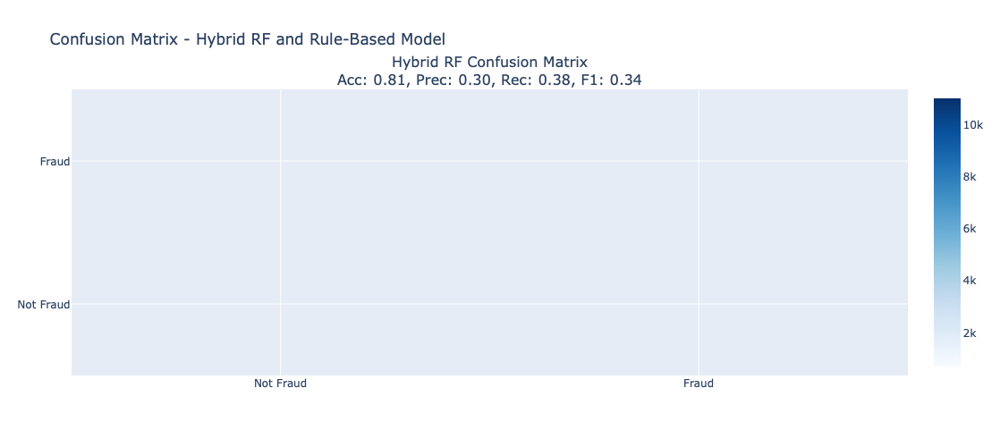

In [68]:
# Step 4: Choose the optimal threshold (max the TPR - FPR)
hybrid_optimal_idx = (hybrid_tpr - hybrid_fpr).argmax()
hybrid_optimal_thres = hybrid_thresholds[hybrid_optimal_idx]

# Convert the risk scores to class predictions
hybrid_y_pred = (risk_rule_df['hybrid_rf_risk_score'] >= hybrid_optimal_thres).astype(int)

# Evaluate the model performance metrics
cm_hybrid = confusion_matrix(y_risk_rule_true, hybrid_y_pred)
acc_hybrid = accuracy_score(y_risk_rule_true, hybrid_y_pred)
prec_hybrid = precision_score(y_risk_rule_true, hybrid_y_pred, zero_division=0)
rec_hybrid = recall_score(y_risk_rule_true, hybrid_y_pred, zero_division=0)
f1_hybrid = f1_score(y_risk_rule_true, hybrid_y_pred, zero_division=0)

labels = ['Not Fraud', 'Fraud']

fig = make_subplots(
    rows=1, cols=1,
    subplot_titles=[f"Hybrid RF Confusion Matrix<br>Acc: {acc_hybrid:.2f}, Prec: {prec_hybrid:.2f}, Rec: {rec_hybrid:.2f}, F1: {f1_hybrid:.2f}"]
)

fig.add_trace(go.Heatmap(
    z=cm_hybrid,
    x=labels,
    y=labels,
    colorscale='Blues',
    showscale=True,
    hovertemplate='Predicted: %{x}<br>Actual: %{y}<br>Count: %{z}<extra></extra>'
), row=1, col=1)

fig.update_layout(
    title_text="Confusion Matrix - Hybrid RF and Rule-Based Model",
    width=600,
    height=500
)
fig.show()

<b> Team Analysis <b/>:

1. <i><b> Accuracy </i> : After being integrated with Rule-based method, the model achieves an overall accuracy of 81%, indicating it classifies 81% transactions correctly. However, this metric may still be misleading due to the inherent class imbalance, where non-fraud transactions dominate (88% of the dataset).
   
2. <i><b> Precision </i>:
- For the fraud class (label 1), precision is 0.3, which means only 30% of flagged transactions are truly fraudulent, where non-fraudulent transactions are incorrectly flagged as fraudulent.
- For the non-fraud class (label 0), the precision is 0.88, meaning 12% of predicted normal transactions were actually fraudulent. This shows the model can still perform well in identifying legitimate transactions.

3. <i><b> Recall </i>:
-  The recall of 0.38 indicates the model detects only 38% of actual fraud cases, with 62% of false negatives missed, pointing to a detection gap.

4. <i><b> F1 Score </i>:
- The overall F1 score of 34% reflects a modest balance between precision and recall, but highlights the model’s limitation in optimizing for the minority fraud class.
- The low F1 score for fraud underscores a trade-off where the model prioritizes avoiding false positives over capturing all fraud cases.



###  Risk Score Model Performance Evaluation 

<b> Measurement </b>:

Among the top 10% of transactions with the highest risk score, the proportion that actually turned out to be fraud (is_fraud = 1):

In [69]:
# Step 1: Rank based on risk score for each model (Random Forest, Rule-based, Hybrid)
risk_rule_df['rf_rank'] = risk_rule_df['rf_fraud_risk_score'].rank(pct=True, ascending=False)
risk_rule_df['rule_rank'] = risk_rule_df['risk_score'].rank(pct=True, ascending=False)
risk_rule_df['hybrid_rank'] = risk_rule_df['hybrid_rf_risk_score'].rank(pct=True, ascending=False)

def fraud_rate_in_top(df, rank_col, threshold=0.1):
    return df[df[rank_col] <= threshold]['is_fraud'].mean()

print("Supervised Model Top 10% Fraud Rate: {:.2%}".format(fraud_rate_in_top(risk_rule_df, 'rf_rank'),0.1))
print("Rule-based Top 10% Fraud Rate: {:.2%}".format(fraud_rate_in_top(risk_rule_df, 'rule_rank'),0.1))
print("Hybrid Top 10% Fraud Rate: {:.2%}".format(fraud_rate_in_top(risk_rule_df, 'hybrid_rank'),0.1))

Supervised Model Top 10% Fraud Rate: 19.58%
Rule-based Top 10% Fraud Rate: 82.69%
Hybrid Top 10% Fraud Rate: 30.26%


<b> Team Analysis <b/>:

- <b> <i> Explainability Gap in Supervised Model</b> </i>: The Supervised model achieves 19.58% fraud rate in the top 10% of transactions, reflecting that although addressing the class imbalance issues can help the model perform well in lightweight scoring, it can still miss nuanced fraud patterns and underutilize the risk assessment, which leads to the failure in optimizing fraud detection. As a result, this method reflects that there's no high guarantee explainability under the machine learning model, even if it performs well during the training period.

- <b> <i>High Accuracy but Low Flexibility in Rule-based Model</b> </i> : The 82.69% fraud rate confirms the Rule-based model’s effectiveness, which is driven by targeted key fraud risk factors, making it easy to trace why the transaction is flagged as fraud. However, the model relies on manual rule definition and batch processing, which may be a challenge to maintain rules to catch false negatives and lead to limit scalability.

- <b> Enhancement with limits in Hybrid Model</b> </i> : Hybrid model achieves 30.26% fraud rate in the top 10% of transactions, showing an improvement over the Supervised Model (19.58%), but still far below the Rule-based model (82.69%). This suggests that the integration of supervised and rule-based does provide further risk signal dectection. However, the hybrid model's lower ROC-AUC (0.58) indicates there might be potential conflicts between machine learning automated scoring prediction and rule-based adjustment rules, making the Hybrid model performance harder to trust in high stakes fraud environments.  
